# 加载包

In [1]:
import modelseedpy
from modelseedpy import MSBuilder, MSGenome
import cobra
from cobra import Metabolite, Reaction, Model, Gene
import pandas as pd
import argparse
import os
import subprocess
import ast
import re
from collections import defaultdict
import cobrakbase
from modelseedpy import GapfillingPkg, KBaseMediaPkg
from modelseedpy import FBAHelper, MSBuilder
from modelseedpy.core.rast_client import RastClient
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

modelseedpy 0.4.0
cobrakbase 0.3.0


In [ ]:
genome = MSGenome.from_fasta("fasta/cds_from_genomic.fna", split=' ')
print('Number of features:', len(genome.features))


In [ ]:
from modelseedpy.helpers import get_template
from modelseedpy.core.mstemplate import MSTemplateBuilder
template = MSTemplateBuilder.from_dict(get_template('template_core')).build()
template

# modelseed

In [132]:
# genome = MSGenome.from_fasta("/hpcfs/fhome/liuysh24/wp/model_database/Copy_Bacteria_UniProt/Bacteria_UniProt/Corynebacterium glutamicum DSM 20300 = ATCC 13032.fasta", split=' ')
rast = RastClient()
genome = rast.annotate_genome_from_fasta("fasta/cds_from_genomic.fna", split=' ')
model = MSBuilder.build_metabolic_model('Corynebacterium glutamicum', genome, gapfill_media=None,  allow_all_non_grp_reactions=True, annotate_with_rast=True)
model
cobra.io.write_sbml_model(model, "fasta/cds_from_genomic.fna.seed.xml")




ValueError: id 'lcl' at index 1 is non-unique. Is it present twice?

In [ ]:
dir_path = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg"
out_dir = '/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model'

In [39]:
genome = MSGenome.from_fasta("/hpcfs/fhome/wupeng/wp/memote/genome_proteins/bigg/Shigella flexneri 2002017_GCF_000022245.1.faa", split=' ')
model = MSBuilder.build_metabolic_model('Shigella flexneri 2002017', genome,  allow_all_non_grp_reactions=True, annotate_with_rast=True)
# templates = [
#     'GramNegModelTemplateV5_test', 'GramPosModelTemplateV5_test', 
#     'ArchaeaModelTemplateV5_test', 'GramNegModelTemplateV5_DNR'
# ]CoreModelTemplateV3

kbase_api = cobrakbase.KBaseAPI()

# template = kbase_api.get_from_ws("GramNegModelTemplateV3","NewKBaseModelTemplates")
# template = kbase_api.get_from_ws("ArchaeaModelTemplateV5","NewKBaseModelTemplates")
template = kbase_api.get_from_ws("GramPosModelTemplateV3","NewKBaseModelTemplates")
# template = kbase_api.get_from_ws("CoreModelTemplateV3","NewKBaseModelTemplates")
# template = kbase_api.get_from_ws("EukaryoteModelTemplateV3", "NewKBaseModelTemplates")

media = kbase_api.get_from_ws("Carbon-D-Glucose","KBaseMedia")
model = MSBuilder.gapfill_model(model,"bio1",template,media)

kmp = KBaseMediaPkg(model)
kmp.build_package(media)
model.summary()

cobra.io.write_sbml_model(model, "/hpcfs/fhome/wupeng/wp/memote/BIGG_seed_model/Shigella flexneri 2002017_GCF_000022245.1.seed.xml")

/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00009_e0,EX_cpd00009_e0,0.618,0,0.00%
cpd00013_e0,EX_cpd00013_e0,6.547,0,0.00%
cpd00027_e0,EX_cpd00027_e0,5,6,100.00%
cpd00030_e0,EX_cpd00030_e0,0.002134,0,0.00%
cpd00034_e0,EX_cpd00034_e0,0.002134,0,0.00%
cpd00048_e0,EX_cpd00048_e0,0.172,0,0.00%
cpd00058_e0,EX_cpd00058_e0,0.002134,0,0.00%
cpd00063_e0,EX_cpd00063_e0,0.002134,0,0.00%
cpd00067_e0,EX_cpd00067_e0,8.334,0,0.00%
cpd00099_e0,EX_cpd00099_e0,0.002134,0,0.00%


In [5]:
# model
model.add_boundary(model.metabolites.cpd00027_c0, type='demand')
# model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
model.reactions.DM_cpd03091_e0.bounds =(0,1000)
model.reactions.DM_cpd00027_c0.bounds =(-10,1000)
model.summary()

Reaction identifier,DM_cpd00027_c0
Name,D-Glucose [c0] demand
Memory address,0x146c272952b0
Stoichiometry,cpd00027_c0 <=> D-Glucose [c0] <=>
GPR,
Lower bound,-10
Upper bound,1000


Metabolite,Reaction,Flux,C-Number,C-Flux
Metabolite,Reaction,Flux,C-Number,C-Flux


In [69]:
model = cobra.io.read_sbml_model('fasta/MG1655.seed.xml')
model
model.reactions.EX_cpd00027_e0.bounds=(-10,1000)
model.summary()

Name,MG1655
Memory address,151cf3d39280
Number of metabolites,1469
Number of reactions,1790
Number of genes,1306
Number of groups,1334
Objective expression,1.0*bio1 - 1.0*bio1_reverse_b18f7
Compartments,"Cytosol, Extracellular"


Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00009_e0,EX_cpd00009_e0,1.234,0,0.00%
cpd00013_e0,EX_cpd00013_e0,13.08,0,0.00%
cpd00027_e0,EX_cpd00027_e0,10,6,100.00%
cpd00030_e0,EX_cpd00030_e0,0.004263,0,0.00%
cpd00034_e0,EX_cpd00034_e0,0.004263,0,0.00%
cpd00048_e0,EX_cpd00048_e0,0.3437,0,0.00%
cpd00058_e0,EX_cpd00058_e0,0.004263,0,0.00%
cpd00063_e0,EX_cpd00063_e0,0.004263,0,0.00%
cpd00067_e0,EX_cpd00067_e0,13.47,0,0.00%
cpd00099_e0,EX_cpd00099_e0,0.004263,0,0.00%


In [82]:
model.reactions.rxn00001_c0.reactants
model.objective = model.reactions.rxn05145_c0
model.summary()

[<Metabolite cpd00001_c0 at 0x151cf45e7eb0>,
 <Metabolite cpd00012_c0 at 0x151cf3382d30>]

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00067_e0,EX_cpd00067_e0,50,0,0.00%
Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00001_e0,EX_cpd00001_e0,-100,0,0.00%


In [81]:
# model.reactions.rxn00001_c0
for i in model.reactions:
    # if i.reaction == 'cpd00001_c0  + cpd00002_c0 --> cpd00008_c0 + cpd00009_c0  + cpd00067_c0':
    if 'cpd00002_c0' in i.reaction and 'cpd00001_c0' in i.reaction and 'cpd00009_c0' in i.reaction and 'cpd00008_c0' in i.reaction and 'cpd00067_c0' in i.reaction:
        print(i)

rxn05156_c0: cpd00001_c0 + cpd00002_c0 + cpd00064_e0 --> cpd00008_c0 + cpd00009_c0 + cpd00064_c0 + cpd00067_c0
rxn05162_c0: cpd00001_c0 + cpd00002_c0 + cpd00108_e0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd00108_c0
rxn05614_c0: cpd00001_c0 + cpd00002_c0 + cpd11576_e0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd11576_c0
rxn10344_c0: cpd00001_c0 + cpd00002_c0 + cpd04097_c0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd04097_e0
rxn05167_c0: cpd00001_c0 + cpd00002_c0 + cpd00154_e0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd00154_c0
rxn05516_c0: cpd00001_c0 + cpd00002_c0 + cpd01012_c0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd01012_e0
rxn08192_c0: cpd00001_c0 + cpd00002_c0 + cpd00635_e0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd00635_c0
rxn05185_c0: cpd00001_c0 + cpd00002_c0 + cpd01055_e0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd01055_c0
rxn05158_c0: cpd00001_c0 + cpd00002_c0 + cpd00080_e0 --> cpd00008_c0 + cpd00009_c0 + cpd00067_c0 + cpd00080_c0
r

# carveme 构建

In [40]:
import os
import subprocess

# 设置当前工作路径

input_file = '/hpcfs/fhome/wupeng/wp/memote/genome_proteins/bigg/Shigella flexneri 2002017_GCF_000022245.1.faa'
output_file = '/hpcfs/fhome/wupeng/wp/memote/BIGG_carve_model/Shigella flexneri 2002017_GCF_000022245.1.faa.xml'

command = f"conda run -n modelseed carve '{input_file}' -g M9 -i M9 -o '{output_file}'"
print(f"正在执行命令: {command}")

try:
    subprocess.run(command, shell=True, check=True)
    print(f"处理完成")
except subprocess.CalledProcessError as e:
    print(f"处理失败, 错误: {e}")


正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/wupeng/wp/memote/genome_proteins/bigg/Shigella flexneri 2002017_GCF_000022245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/wupeng/wp/memote/BIGG_carve_model/Shigella flexneri 2002017_GCF_000022245.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/wupeng/wp/memote/genome_proteins/bigg/Shigella flexneri 2002017_GCF_000022245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/wupeng/wp/memote/BIGG_carve_model/Shigella flexneri 2002017_GCF_000022245.1.faa.xml'", returncode=0)

处理完成


In [129]:
# model
# model.reactions.EX_cpd00027_e0.bounds=(-10,1000)
# model.summary()
model = cobra.io.read_sbml_model('fasta/MG1655.xml')
# model = cobra.io.read_sbml_model('fasta/MG1655.seed.xml')
model.summary()

ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Metabolite,Reaction,Flux,C-Number,C-Flux
ca2_e,EX_ca2_e,0.005266,0,0.00%
cl_e,EX_cl_e,0.005266,0,0.00%
cobalt2_e,EX_cobalt2_e,0.0001012,0,0.00%
cu2_e,EX_cu2_e,0.0007173,0,0.00%
fe2_e,EX_fe2_e,0.006794,0,0.00%
fe3_e,EX_fe3_e,0.007899,0,0.00%
glc__D_e,EX_glc__D_e,10,6,100.00%
k_e,EX_k_e,0.1975,0,0.00%
mg2_e,EX_mg2_e,0.008777,0,0.00%
mn2_e,EX_mn2_e,0.0006991,0,0.00%


In [124]:
# model
model.reactions.EX_glc__D_e.bounds = (-10, 1000)
for i in model.exchanges:
    for n in i.metabolites:
        if 'C' in n.formula:
            bound = i.bounds
            i.bounds = (0,1000)
            sol = model.optimize().objective_value
            if sol < 0.0000001:
                i.bounds = (-10,1000)
# model.reactions.EX_s_e.bounds = (0, 1000)
model.reactions.EX_glc__D_e.bounds = (-10, 1000)
model.reactions.EX_xylu__L_e.bounds = (0, 1000)
model.objective = model.reactions.ATPM
model.reactions.EX_h2_e.bounds = (0,1000)
model.objective = model.reactions.Growth 

model.summary()
# cobra.io.write_sbml_model(model,'fasta/Pst_uniprot.faa.xml')

Metabolite,Reaction,Flux,C-Number,C-Flux
ca2_e,EX_ca2_e,0.005109,0,0.00%
cl_e,EX_cl_e,0.005109,0,0.00%
cobalt2_e,EX_cobalt2_e,9.816E-05,0,0.00%
cu_e,EX_cu_e,0.000696,0,0.00%
fe2_e,EX_fe2_e,0.01426,0,0.00%
glc__D_e,EX_glc__D_e,10,6,100.00%
k_e,EX_k_e,0.1916,0,0.00%
mg2_e,EX_mg2_e,0.008516,0,0.00%
mn2_e,EX_mn2_e,0.0006783,0,0.00%
nh4_e,EX_nh4_e,10.99,0,0.00%


In [131]:
model = cobra.io.read_sbml_model('fasta/MG1655.xml')
# model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
outfile = 'pear_1655_biomass.txt'
# model.objective = model.reactions.ATPM
# model.objective = model.reactions.Growth 
# model.objective = model.reactions.rxn05145_c0
# model.objective = model.reactions.bio1 
# model.objective = model.reactions.ATPM
model.objective = model.reactions.biomass 

need_fluxes = model.optimize().fluxes[abs(model.optimize().fluxes) > 0]
flux = open(outfile, 'w')
for r, v in need_fluxes.items():
    if abs(v) > 1e-6:
        # for i in model.reactions:
        a = model.reactions.get_by_id(r).check_mass_balance()
        flux.write(r + '\t' + str(model.reactions.get_by_id(r).bounds) +
                    '\t' + str(round(v, 4)) + '\t' +
                    model.reactions.get_by_id(r).build_reaction_string(
                        use_metabolite_names=True) + '\n')
#           flux.write(r +'\t' + str(round(v,4)) + '\t' + model.reactions.get_by_id(r).reaction +'\n')
flux.close()


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


94

77

83

125

88

95

109

149

184

123

87

231

135

146

203

124

92

123

187

53

90

46

94

85

101

184

135

147

97

162

109

117

167

111

206

179

103

117

79

61

124

122

121

152

59

87

115

90

111

156

160

165

149

110

95

125

61

270

129

147

109

99

191

105

105

134

210

61

81

154

155

124

179

161

181

153

111

108

109

112

111

134

106

133

244

125

88

163

76

99

130

117

138

112

82

164

182

123

111

221

131

105

80

98

113

104

145

145

143

84

146

88

172

101

115

125

139

70

136

87

178

235

131

176

152

207

267

100

92

112

172

142

153

142

94

188

123

103

68

71

113

93

91

174

222

104

205

132

164

54

97

221

88

72

106

104

86

130

71

94

164

93

107

92

106

148

107

108

194

112

101

123

77

174

102

114

87

123

200

193

176

165

109

107

107

191

54

70

150

89

148

78

182

150

86

174

120

85

195

197

117

77

106

198

146

113

145

96

134

84

130

263

154

180

129

81

168

88

166

161

155

231

225

145

110

113

168

131

143

79

163

120

143

161

107

138

79

87

142

113

166

130

106

141

300

107

127

106

118

102

131

120

126

235

129

182

52

53

54

50

72

60

54

56

55

52

46

50

54

50

48

259

176

72

154

195

135

279

116

49

2173

167

102

100

48

54

48

48

49

47

58

52

48

39

48

50

50

50

46

49

48

45

48

46

125

52

42

85

89

121

171

94

173

148

89

229

In [ ]:
cobra.io.write_sbml_model(model, "/home/liaonan/my_metabolic_model.xml")

# 批量modelseed构建

In [2]:
import modelseedpy
from modelseedpy import MSBuilder, MSGenome
import cobra
from cobra import Metabolite, Reaction, Model, Gene
import os
from collections import defaultdict
import cobrakbase
from modelseedpy import GapfillingPkg, KBaseMediaPkg
from modelseedpy import FBAHelper, MSBuilder
from modelseedpy.core.rast_client import RastClient

os.chdir('/hpcfs/fhome/liuysh24/wp/memote/')

dir_path = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/Eukaryota/"
dir_path = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/Archaea"
dir_path = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/文献序列合"
out_dir = '/hpcfs/fhome/liuysh24/wp/memote/文献序列合_modelseed_model/'
dir_path = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg"
out_dir = '/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model'

os.makedirs(out_dir, exist_ok=True)

# 遍历文件夹下的所有 .faa 文件
for filename in os.listdir(dir_path):
    if filename.endswith('.faa'):
        file_path = os.path.join(dir_path, filename)
        output_file = os.path.join(out_dir, f"{filename.rsplit('.', 1)[0]}.seed.xml")
        print(f"开始构建模型：{output_file}")
        try:# 加载基因组数据
            genome = MSGenome.from_fasta(file_path, split=' ')
            model = MSBuilder.build_metabolic_model(
                filename.rsplit('.', 1)[0], 
                genome,  
                allow_all_non_grp_reactions=True, 
                annotate_with_rast=True
            )
            # 设置模板和培养基
            kbase_api = cobrakbase.KBaseAPI()
            template = kbase_api.get_from_ws("GramPosModelTemplateV3", "NewKBaseModelTemplates")
            media = kbase_api.get_from_ws("Carbon-D-Glucose", "KBaseMedia")
            model = MSBuilder.gapfill_model(model, "bio1", template, media)
            model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
            kmp = KBaseMediaPkg(model)
            kmp.build_package(media)
            cobra.io.write_sbml_model(model, output_file)

            print(f"成功处理文件: {filename}，模型已输出到：{output_file}")
        except Exception as e:
            print(f"处理文件 {filename} 时出错，错误信息: {e}")
            continue

开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Clostridium ljungdahlii DSM 13528_GCF_000143685.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Clostridium ljungdahlii DSM 13528_GCF_000143685.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Clostridium ljungdahlii DSM 13528_GCF_000143685.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ETEC H10407_GCF_000210475.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli ETEC H10407_GCF_000210475.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ETEC H10407_GCF_000210475.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium knowlesi strain H_GCF_000006355.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00971 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Plasmodium knowlesi strain H_GCF_000006355.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium knowlesi strain H_GCF_000006355.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli SMS-3-5_GCF_000019645.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli SMS-3-5_GCF_000019645.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli SMS-3-5_GCF_000019645.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O103_H2 str. 12009_GCF_000010745.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O103_H2 str. 12009_GCF_000010745.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O103_H2 str. 12009_GCF_000010745.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803_GCF_001318385.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Synechocystis sp. PCC 6803_GCF_001318385.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803_GCF_001318385.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli 042_GCF_000027125.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli 042_GCF_000027125.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli 042_GCF_000027125.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ABU 83972_GCF_000148365.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli ABU 83972_GCF_000148365.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ABU 83972_GCF_000148365.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Cricetulus griseus_GCF_000223135.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Cricetulus griseus_GCF_000223135.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Cricetulus griseus_GCF_000223135.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O111:H- str. 11128_GCF_000010765.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O111:H- str. 11128_GCF_000010765.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O111:H- str. 11128_GCF_000010765.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ATCC 8739_GCF_000019385.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli ATCC 8739_GCF_000019385.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ATCC 8739_GCF_000019385.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli IAI39_GCF_000026345.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli IAI39_GCF_000026345.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli IAI39_GCF_000026345.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli BW2952_GCF_000022345.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli BW2952_GCF_000022345.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli BW2952_GCF_000022345.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella flexneri 2a str. 301_GCF_000006925.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Shigella flexneri 2a str. 301_GCF_000006925.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella flexneri 2a str. 301_GCF_000006925.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli HS_GCF_000017765.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli HS_GCF_000017765.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli HS_GCF_000017765.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli NA114_GCF_000214765.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli NA114_GCF_000214765.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli NA114_GCF_000214765.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Geobacter metallireducens GS-15_GCF_000012925.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Geobacter metallireducens GS-15_GCF_000012925.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Geobacter metallireducens GS-15_GCF_000012925.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli SE15_GCF_000010485.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli SE15_GCF_000010485.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli SE15_GCF_000010485.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Clostridioides difficile 630_GCF_000009205.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Clostridioides difficile 630_GCF_000009205.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Clostridioides difficile 630_GCF_000009205.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli 536_GCF_000013305.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli 536_GCF_000013305.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli 536_GCF_000013305.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Mycobacterium tuberculosis H37Rv.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Mycobacterium tuberculosis H37Rv.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Mycobacterium tuberculosis H37Rv.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella flexneri 5 str. 8401_GCF_000013585.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Shigella flexneri 5 str. 8401_GCF_000013585.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella flexneri 5 str. 8401_GCF_000013585.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli W_GCF_000258145.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli W_GCF_000258145.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli W_GCF_000258145.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Saccharomyces cerevisiae S288C_GCF_000146045.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Saccharomyces cerevisiae S288C_GCF_000146045.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Saccharomyces cerevisiae S288C_GCF_000146045.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Helicobacter pylori 26695_GCF_000307795.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Helicobacter pylori 26695_GCF_000307795.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Helicobacter pylori 26695_GCF_000307795.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella sonnei Ss046_GCF_000092525.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Shigella sonnei Ss046_GCF_000092525.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella sonnei Ss046_GCF_000092525.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium cynomolgi strain B_GCF_000321355.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00971 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Plasmodium cynomolgi strain B_GCF_000321355.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium cynomolgi strain B_GCF_000321355.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli 55989_GCF_000026245.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli 55989_GCF_000026245.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli 55989_GCF_000026245.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium falciparum 3D7_GCF_000002765.6.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00971 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Plasmodium falciparum 3D7_GCF_000002765.6.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium falciparum 3D7_GCF_000002765.6.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli IHE3034_GCF_000025745.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli IHE3034_GCF_000025745.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli IHE3034_GCF_000025745.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella boydii CDC 3083-94_GCF_000020185.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Shigella boydii CDC 3083-94_GCF_000020185.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella boydii CDC 3083-94_GCF_000020185.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Yersinia pestis CO92_GCF_000009065.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Yersinia pestis CO92_GCF_000009065.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Yersinia pestis CO92_GCF_000009065.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium berghei ANKA_GCF_900002375.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00971 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Plasmodium berghei ANKA_GCF_900002375.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium berghei ANKA_GCF_900002375.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UMN026_GCF_000026325.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli UMN026_GCF_000026325.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UMN026_GCF_000026325.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli B str. REL606_GCF_000017985.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli B str. REL606_GCF_000017985.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli B str. REL606_GCF_000017985.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium vivax Sal-1_GCF_000002415.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00971 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Plasmodium vivax Sal-1_GCF_000002415.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Plasmodium vivax Sal-1_GCF_000002415.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli IAI1_GCF_000026265.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli IAI1_GCF_000026265.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli IAI1_GCF_000026265.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli DH1_GCF_000023365.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli DH1_GCF_000023365.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli DH1_GCF_000023365.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechococcus elongatus PCC 7942_GCF_000012525.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Synechococcus elongatus PCC 7942_GCF_000012525.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechococcus elongatus PCC 7942_GCF_000012525.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli KO11FL_GCF_000258025.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli KO11FL_GCF_000258025.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli KO11FL_GCF_000258025.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli BL21(DE3)_GCF_000022665.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli BL21(DE3)_GCF_000022665.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli BL21(DE3)_GCF_000022665.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella boydii Sb227_GCF_000012025.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Shigella boydii Sb227_GCF_000012025.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella boydii Sb227_GCF_000012025.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ATCC 25922_GCF_000743255.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli ATCC 25922_GCF_000743255.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ATCC 25922_GCF_000743255.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803_GCF_000009725.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Synechocystis sp. PCC 6803_GCF_000009725.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803_GCF_000009725.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Thermotoga maritima MSB8_GCF_000008545.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!


成功处理文件: Thermotoga maritima MSB8_GCF_000008545.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Thermotoga maritima MSB8_GCF_000008545.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella dysenteriae Sd197_GCF_000012005.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Shigella dysenteriae Sd197_GCF_000012005.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella dysenteriae Sd197_GCF_000012005.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli C_GCF_002079225.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli C_GCF_002079225.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli C_GCF_002079225.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ED1a_GCF_000026305.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli ED1a_GCF_000026305.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli ED1a_GCF_000026305.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli APEC O1_GCF_000014845.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli APEC O1_GCF_000014845.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli APEC O1_GCF_000014845.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Trypanosoma cruzi Dm28c_GCA_003177105.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00971 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Trypanosoma cruzi Dm28c_GCA_003177105.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Trypanosoma cruzi Dm28c_GCA_003177105.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli CFT073_GCF_000007445.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli CFT073_GCF_000007445.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli CFT073_GCF_000007445.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Methanosarcina barkeri MS_GCF_000970025.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Methanosarcina barkeri MS_GCF_000970025.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Methanosarcina barkeri MS_GCF_000970025.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Pseudomonas putida KT2440_GCF_000007565.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Pseudomonas putida KT2440_GCF_000007565.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Pseudomonas putida KT2440_GCF_000007565.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Acinetobacter baumannii AYE_GCF_000069245.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Acinetobacter baumannii AYE_GCF_000069245.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Acinetobacter baumannii AYE_GCF_000069245.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UMNK88_GCF_000212715.2.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli UMNK88_GCF_000212715.2.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UMNK88_GCF_000212715.2.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli DH5[alpha]_GCF_000982435.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli DH5[alpha]_GCF_000982435.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli DH5[alpha]_GCF_000982435.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UM146_GCF_000148605.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli UM146_GCF_000148605.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UM146_GCF_000148605.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli S88_GCF_000026285.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli S88_GCF_000026285.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli S88_GCF_000026285.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella flexneri 2a str. 2457T_GCF_000007405.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Shigella flexneri 2a str. 2457T_GCF_000007405.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Shigella flexneri 2a str. 2457T_GCF_000007405.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UTI89_GCF_000013265.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli UTI89_GCF_000013265.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli UTI89_GCF_000013265.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli DH1_GCF_000270105.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli DH1_GCF_000270105.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli DH1_GCF_000270105.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd11574 not found in model!


成功处理文件: Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
INFO:modelseedpy.core.msmodelutl:cpd00244 not found in model!


成功处理文件: Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O26:H11 str. 11368_GCF_000091005.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli O26:H11 str. 11368_GCF_000091005.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli O26:H11 str. 11368_GCF_000091005.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli LF82_GCF_021398935.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli LF82_GCF_021398935.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli LF82_GCF_021398935.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli SE11_GCF_000010385.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli SE11_GCF_000010385.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli SE11_GCF_000010385.1.seed.xml
开始构建模型：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli LF82_GCF_000284495.1.seed.xml


/hpcfs/fhome/liuysh24/.conda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


成功处理文件: Escherichia coli LF82_GCF_000284495.1.faa，模型已输出到：/hpcfs/fhome/liuysh24/wp/memote/BIGG_seed_model/Escherichia coli LF82_GCF_000284495.1.seed.xml


# carveme批量构建

In [ ]:
import os
import subprocess

# 设置当前工作路径
os.chdir('/hpcfs/fhome/liuysh24/wp/memote/')

# input_folder = '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/Eukaryota/'
# input_folder = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/Archaea"
# output_folder = 'carve_model/'

# input_folder = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/文献序列合"
# output_folder = '/hpcfs/fhome/liuysh24/wp/memote/文献序列合_carve_model/'

input_folder = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg"
output_folder = '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model'

os.makedirs(output_folder, exist_ok=True)

# 遍历文件夹下的所有 .faa 文件
for filename in os.listdir(input_folder):
    if filename.endswith('.faa'):

        input_file = os.path.join(input_folder, filename)
        output_file = os.path.join(output_folder, f"{filename}.xml")

        command = f"conda run -n modelseed carve '{input_file}' -g M9 -i M9 -o '{output_file}'"
        print(f"正在执行命令: {command}")

        try:
            subprocess.run(command, shell=True, check=True)
            print(f"处理完成: {filename}")
        except subprocess.CalledProcessError as e:
            print(f"处理失败: {filename}, 错误: {e}")


正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Clostridium ljungdahlii DSM 13528_GCF_000143685.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Clostridium ljungdahlii DSM 13528_GCF_000143685.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Clostridium ljungdahlii DSM 13528_GCF_000143685.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Clostridium ljungdahlii DSM 13528_GCF_000143685.1.faa.xml'", returncode=0)

处理完成: Clostridium ljungdahlii DSM 13528_GCF_000143685.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ETEC H10407_GCF_000210475.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ETEC H10407_GCF_000210475.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ETEC H10407_GCF_000210475.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ETEC H10407_GCF_000210475.1.faa.xml'", returncode=0)

处理完成: Escherichia coli ETEC H10407_GCF_000210475.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium knowlesi strain H_GCF_000006355.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium knowlesi strain H_GCF_000006355.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium knowlesi strain H_GCF_000006355.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium knowlesi strain H_GCF_000006355.2.faa.xml'", returncode=0)

处理完成: Plasmodium knowlesi strain H_GCF_000006355.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.faa.xml'", returncode=0)

处理完成: Corynebacterium glutamicum ATCC 13032_GCF_000011325.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli SMS-3-5_GCF_000019645.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli SMS-3-5_GCF_000019645.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli SMS-3-5_GCF_000019645.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli SMS-3-5_GCF_000019645.1.faa.xml'", returncode=0)

处理完成: Escherichia coli SMS-3-5_GCF_000019645.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O103_H2 str. 12009_GCF_000010745.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O103_H2 str. 12009_GCF_000010745.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O103_H2 str. 12009_GCF_000010745.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O103_H2 str. 12009_GCF_000010745.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O103_H2 str. 12009_GCF_000010745.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.faa.xml'", returncode=0)

处理完成: Klebsiella pneumoniae subsp. pneumoniae MGH 78578_GCF_000016305.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803_GCF_001318385.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803_GCF_001318385.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803_GCF_001318385.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803_GCF_001318385.1.faa.xml'", returncode=0)

处理完成: Synechocystis sp. PCC 6803_GCF_001318385.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli 042_GCF_000027125.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli 042_GCF_000027125.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli 042_GCF_000027125.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli 042_GCF_000027125.1.faa.xml'", returncode=0)

处理完成: Escherichia coli 042_GCF_000027125.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.faa.xml'", returncode=0)

处理完成: Phaeodactylum tricornutum CCAP 1055_1_GCF_000150955.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ABU 83972_GCF_000148365.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ABU 83972_GCF_000148365.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ABU 83972_GCF_000148365.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ABU 83972_GCF_000148365.1.faa.xml'", returncode=0)

处理完成: Escherichia coli ABU 83972_GCF_000148365.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O139:H28 str. E24377A_GCF_000017745.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Cricetulus griseus_GCF_000223135.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Cricetulus griseus_GCF_000223135.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Cricetulus griseus_GCF_000223135.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Cricetulus griseus_GCF_000223135.1.faa.xml'", returncode=0)

处理完成: Cricetulus griseus_GCF_000223135.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O157:H7 str. TW14359_GCF_000022225.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.faa.xml'", returncode=0)

处理完成: Staphylococcus aureus subsp. aureus N315_GCF_000009645.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O111:H- str. 11128_GCF_000010765.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O111:H- str. 11128_GCF_000010765.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O111:H- str. 11128_GCF_000010765.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O111:H- str. 11128_GCF_000010765.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O111:H- str. 11128_GCF_000010765.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ATCC 8739_GCF_000019385.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ATCC 8739_GCF_000019385.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ATCC 8739_GCF_000019385.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ATCC 8739_GCF_000019385.1.faa.xml'", returncode=0)

处理完成: Escherichia coli ATCC 8739_GCF_000019385.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O127:H6 str. E2348_69_GCF_000026545.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli IAI39_GCF_000026345.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli IAI39_GCF_000026345.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli IAI39_GCF_000026345.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli IAI39_GCF_000026345.1.faa.xml'", returncode=0)

处理完成: Escherichia coli IAI39_GCF_000026345.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli BW2952_GCF_000022345.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli BW2952_GCF_000022345.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli BW2952_GCF_000022345.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli BW2952_GCF_000022345.1.faa.xml'", returncode=0)

处理完成: Escherichia coli BW2952_GCF_000022345.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.faa.xml'", returncode=0)

处理完成: Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella flexneri 2a str. 301_GCF_000006925.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella flexneri 2a str. 301_GCF_000006925.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella flexneri 2a str. 301_GCF_000006925.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella flexneri 2a str. 301_GCF_000006925.2.faa.xml'", returncode=0)

处理完成: Shigella flexneri 2a str. 301_GCF_000006925.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli HS_GCF_000017765.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli HS_GCF_000017765.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli HS_GCF_000017765.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli HS_GCF_000017765.1.faa.xml'", returncode=0)

处理完成: Escherichia coli HS_GCF_000017765.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli NA114_GCF_000214765.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli NA114_GCF_000214765.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli NA114_GCF_000214765.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli NA114_GCF_000214765.2.faa.xml'", returncode=0)

处理完成: Escherichia coli NA114_GCF_000214765.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.faa.xml'", returncode=0)

处理完成: Escherichia coli &#x27;BL21-Gold(DE3)pLysS AG&#x27;_GCF_000023665.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Geobacter metallireducens GS-15_GCF_000012925.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Geobacter metallireducens GS-15_GCF_000012925.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Geobacter metallireducens GS-15_GCF_000012925.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Geobacter metallireducens GS-15_GCF_000012925.1.faa.xml'", returncode=0)

处理完成: Geobacter metallireducens GS-15_GCF_000012925.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli SE15_GCF_000010485.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli SE15_GCF_000010485.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli SE15_GCF_000010485.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli SE15_GCF_000010485.1.faa.xml'", returncode=0)

处理完成: Escherichia coli SE15_GCF_000010485.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Clostridioides difficile 630_GCF_000009205.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Clostridioides difficile 630_GCF_000009205.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Clostridioides difficile 630_GCF_000009205.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Clostridioides difficile 630_GCF_000009205.2.faa.xml'", returncode=0)

处理完成: Clostridioides difficile 630_GCF_000009205.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O157:H7 str. EC4115_GCF_000021125.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.faa.xml'", returncode=0)

处理完成: Escherichia coli str. K-12 substr. MG1655_GCF_000005845.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli 536_GCF_000013305.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli 536_GCF_000013305.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli 536_GCF_000013305.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli 536_GCF_000013305.1.faa.xml'", returncode=0)

处理完成: Escherichia coli 536_GCF_000013305.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Mycobacterium tuberculosis H37Rv.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Mycobacterium tuberculosis H37Rv.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Mycobacterium tuberculosis H37Rv.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Mycobacterium tuberculosis H37Rv.faa.xml'", returncode=0)

处理完成: Mycobacterium tuberculosis H37Rv.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella flexneri 5 str. 8401_GCF_000013585.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella flexneri 5 str. 8401_GCF_000013585.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella flexneri 5 str. 8401_GCF_000013585.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella flexneri 5 str. 8401_GCF_000013585.1.faa.xml'", returncode=0)

处理完成: Shigella flexneri 5 str. 8401_GCF_000013585.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli W_GCF_000258145.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli W_GCF_000258145.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli W_GCF_000258145.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli W_GCF_000258145.1.faa.xml'", returncode=0)

处理完成: Escherichia coli W_GCF_000258145.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.faa.xml'", returncode=0)

处理完成: Staphylococcus aureus subsp. aureus USA300_TCH1516_GCF_000017085.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Saccharomyces cerevisiae S288C_GCF_000146045.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Saccharomyces cerevisiae S288C_GCF_000146045.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Saccharomyces cerevisiae S288C_GCF_000146045.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Saccharomyces cerevisiae S288C_GCF_000146045.2.faa.xml'", returncode=0)

处理完成: Saccharomyces cerevisiae S288C_GCF_000146045.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Helicobacter pylori 26695_GCF_000307795.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Helicobacter pylori 26695_GCF_000307795.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Helicobacter pylori 26695_GCF_000307795.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Helicobacter pylori 26695_GCF_000307795.1.faa.xml'", returncode=0)

处理完成: Helicobacter pylori 26695_GCF_000307795.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella sonnei Ss046_GCF_000092525.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella sonnei Ss046_GCF_000092525.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella sonnei Ss046_GCF_000092525.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella sonnei Ss046_GCF_000092525.1.faa.xml'", returncode=0)

处理完成: Shigella sonnei Ss046_GCF_000092525.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium cynomolgi strain B_GCF_000321355.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium cynomolgi strain B_GCF_000321355.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium cynomolgi strain B_GCF_000321355.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium cynomolgi strain B_GCF_000321355.1.faa.xml'", returncode=0)

处理完成: Plasmodium cynomolgi strain B_GCF_000321355.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli 55989_GCF_000026245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli 55989_GCF_000026245.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli 55989_GCF_000026245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli 55989_GCF_000026245.1.faa.xml'", returncode=0)

处理完成: Escherichia coli 55989_GCF_000026245.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium falciparum 3D7_GCF_000002765.6.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium falciparum 3D7_GCF_000002765.6.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium falciparum 3D7_GCF_000002765.6.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium falciparum 3D7_GCF_000002765.6.faa.xml'", returncode=0)

处理完成: Plasmodium falciparum 3D7_GCF_000002765.6.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli IHE3034_GCF_000025745.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli IHE3034_GCF_000025745.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli IHE3034_GCF_000025745.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli IHE3034_GCF_000025745.1.faa.xml'", returncode=0)

处理完成: Escherichia coli IHE3034_GCF_000025745.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella boydii CDC 3083-94_GCF_000020185.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella boydii CDC 3083-94_GCF_000020185.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella boydii CDC 3083-94_GCF_000020185.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella boydii CDC 3083-94_GCF_000020185.1.faa.xml'", returncode=0)

处理完成: Shigella boydii CDC 3083-94_GCF_000020185.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Yersinia pestis CO92_GCF_000009065.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Yersinia pestis CO92_GCF_000009065.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Yersinia pestis CO92_GCF_000009065.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Yersinia pestis CO92_GCF_000009065.1.faa.xml'", returncode=0)

处理完成: Yersinia pestis CO92_GCF_000009065.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.faa.xml'", returncode=0)

处理完成: Salmonella enterica subsp. enterica serovar Typhimurium str. LT2_GCF_000006945.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium berghei ANKA_GCF_900002375.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium berghei ANKA_GCF_900002375.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium berghei ANKA_GCF_900002375.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium berghei ANKA_GCF_900002375.2.faa.xml'", returncode=0)

处理完成: Plasmodium berghei ANKA_GCF_900002375.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UMN026_GCF_000026325.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UMN026_GCF_000026325.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UMN026_GCF_000026325.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UMN026_GCF_000026325.1.faa.xml'", returncode=0)

处理完成: Escherichia coli UMN026_GCF_000026325.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli B str. REL606_GCF_000017985.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli B str. REL606_GCF_000017985.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli B str. REL606_GCF_000017985.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli B str. REL606_GCF_000017985.1.faa.xml'", returncode=0)

处理完成: Escherichia coli B str. REL606_GCF_000017985.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O157:H7 str. EDL933_GCF_000732965.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium vivax Sal-1_GCF_000002415.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium vivax Sal-1_GCF_000002415.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Plasmodium vivax Sal-1_GCF_000002415.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Plasmodium vivax Sal-1_GCF_000002415.2.faa.xml'", returncode=0)

处理完成: Plasmodium vivax Sal-1_GCF_000002415.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.faa.xml'", returncode=0)

处理完成: Synechocystis sp. PCC 6803 substr. PCC-N_GCF_000284215.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli IAI1_GCF_000026265.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli IAI1_GCF_000026265.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli IAI1_GCF_000026265.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli IAI1_GCF_000026265.1.faa.xml'", returncode=0)

处理完成: Escherichia coli IAI1_GCF_000026265.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.faa.xml'", returncode=0)

处理完成: Synechocystis sp. PCC 6803 substr. GT-I_GCF_000284135.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli DH1_GCF_000023365.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli DH1_GCF_000023365.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli DH1_GCF_000023365.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli DH1_GCF_000023365.1.faa.xml'", returncode=0)

处理完成: Escherichia coli DH1_GCF_000023365.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechococcus elongatus PCC 7942_GCF_000012525.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechococcus elongatus PCC 7942_GCF_000012525.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechococcus elongatus PCC 7942_GCF_000012525.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechococcus elongatus PCC 7942_GCF_000012525.1.faa.xml'", returncode=0)

处理完成: Synechococcus elongatus PCC 7942_GCF_000012525.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli KO11FL_GCF_000258025.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli KO11FL_GCF_000258025.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli KO11FL_GCF_000258025.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli KO11FL_GCF_000258025.1.faa.xml'", returncode=0)

处理完成: Escherichia coli KO11FL_GCF_000258025.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli BL21(DE3)_GCF_000022665.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli BL21(DE3)_GCF_000022665.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli BL21(DE3)_GCF_000022665.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli BL21(DE3)_GCF_000022665.1.faa.xml'", returncode=0)

处理完成: Escherichia coli BL21(DE3)_GCF_000022665.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella boydii Sb227_GCF_000012025.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella boydii Sb227_GCF_000012025.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella boydii Sb227_GCF_000012025.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella boydii Sb227_GCF_000012025.1.faa.xml'", returncode=0)

处理完成: Shigella boydii Sb227_GCF_000012025.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ATCC 25922_GCF_000743255.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ATCC 25922_GCF_000743255.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ATCC 25922_GCF_000743255.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ATCC 25922_GCF_000743255.1.faa.xml'", returncode=0)

处理完成: Escherichia coli ATCC 25922_GCF_000743255.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803_GCF_000009725.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803_GCF_000009725.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803_GCF_000009725.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803_GCF_000009725.1.faa.xml'", returncode=0)

处理完成: Synechocystis sp. PCC 6803_GCF_000009725.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Thermotoga maritima MSB8_GCF_000008545.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Thermotoga maritima MSB8_GCF_000008545.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Thermotoga maritima MSB8_GCF_000008545.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Thermotoga maritima MSB8_GCF_000008545.1.faa.xml'", returncode=0)

处理完成: Thermotoga maritima MSB8_GCF_000008545.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.faa.xml'", returncode=0)

处理完成: Escherichia coli str. K-12 substr. DH10B_GCF_000019425.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.faa.xml'", returncode=0)

处理完成: Escherichia coli str. K-12 substr. W3110_GCF_000010245.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella dysenteriae Sd197_GCF_000012005.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella dysenteriae Sd197_GCF_000012005.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella dysenteriae Sd197_GCF_000012005.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella dysenteriae Sd197_GCF_000012005.1.faa.xml'", returncode=0)

处理完成: Shigella dysenteriae Sd197_GCF_000012005.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O55:H7 str. CB9615_GCF_000025165.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli C_GCF_002079225.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli C_GCF_002079225.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli C_GCF_002079225.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli C_GCF_002079225.1.faa.xml'", returncode=0)

处理完成: Escherichia coli C_GCF_002079225.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ED1a_GCF_000026305.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ED1a_GCF_000026305.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli ED1a_GCF_000026305.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli ED1a_GCF_000026305.1.faa.xml'", returncode=0)

处理完成: Escherichia coli ED1a_GCF_000026305.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.faa.xml'", returncode=0)

处理完成: Chlamydomonas reinhardtii strain CC-503_GCF_000002595.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli APEC O1_GCF_000014845.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli APEC O1_GCF_000014845.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli APEC O1_GCF_000014845.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli APEC O1_GCF_000014845.1.faa.xml'", returncode=0)

处理完成: Escherichia coli APEC O1_GCF_000014845.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Trypanosoma cruzi Dm28c_GCA_003177105.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Trypanosoma cruzi Dm28c_GCA_003177105.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Trypanosoma cruzi Dm28c_GCA_003177105.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Trypanosoma cruzi Dm28c_GCA_003177105.1.faa.xml'", returncode=0)

处理完成: Trypanosoma cruzi Dm28c_GCA_003177105.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli CFT073_GCF_000007445.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli CFT073_GCF_000007445.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli CFT073_GCF_000007445.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli CFT073_GCF_000007445.1.faa.xml'", returncode=0)

处理完成: Escherichia coli CFT073_GCF_000007445.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.faa.xml'", returncode=0)

处理完成: Escherichia coli O157:H7 str. Sakai_GCF_000008865.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O83:H1 str. NRG 857C_GCF_000183345.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Methanosarcina barkeri MS_GCF_000970025.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Methanosarcina barkeri MS_GCF_000970025.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Methanosarcina barkeri MS_GCF_000970025.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Methanosarcina barkeri MS_GCF_000970025.1.faa.xml'", returncode=0)

处理完成: Methanosarcina barkeri MS_GCF_000970025.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Pseudomonas putida KT2440_GCF_000007565.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Pseudomonas putida KT2440_GCF_000007565.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Pseudomonas putida KT2440_GCF_000007565.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Pseudomonas putida KT2440_GCF_000007565.2.faa.xml'", returncode=0)

处理完成: Pseudomonas putida KT2440_GCF_000007565.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Acinetobacter baumannii AYE_GCF_000069245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Acinetobacter baumannii AYE_GCF_000069245.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Acinetobacter baumannii AYE_GCF_000069245.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Acinetobacter baumannii AYE_GCF_000069245.1.faa.xml'", returncode=0)

处理完成: Acinetobacter baumannii AYE_GCF_000069245.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UMNK88_GCF_000212715.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UMNK88_GCF_000212715.2.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UMNK88_GCF_000212715.2.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UMNK88_GCF_000212715.2.faa.xml'", returncode=0)

处理完成: Escherichia coli UMNK88_GCF_000212715.2.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli DH5[alpha]_GCF_000982435.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli DH5[alpha]_GCF_000982435.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli DH5[alpha]_GCF_000982435.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli DH5[alpha]_GCF_000982435.1.faa.xml'", returncode=0)

处理完成: Escherichia coli DH5[alpha]_GCF_000982435.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UM146_GCF_000148605.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UM146_GCF_000148605.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UM146_GCF_000148605.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UM146_GCF_000148605.1.faa.xml'", returncode=0)

处理完成: Escherichia coli UM146_GCF_000148605.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.faa.xml'", returncode=0)

处理完成: Synechocystis sp. PCC 6803 substr. PCC-P_GCF_000284455.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli S88_GCF_000026285.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli S88_GCF_000026285.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli S88_GCF_000026285.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli S88_GCF_000026285.1.faa.xml'", returncode=0)

处理完成: Escherichia coli S88_GCF_000026285.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella flexneri 2a str. 2457T_GCF_000007405.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella flexneri 2a str. 2457T_GCF_000007405.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Shigella flexneri 2a str. 2457T_GCF_000007405.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Shigella flexneri 2a str. 2457T_GCF_000007405.1.faa.xml'", returncode=0)

处理完成: Shigella flexneri 2a str. 2457T_GCF_000007405.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UTI89_GCF_000013265.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UTI89_GCF_000013265.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli UTI89_GCF_000013265.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli UTI89_GCF_000013265.1.faa.xml'", returncode=0)

处理完成: Escherichia coli UTI89_GCF_000013265.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli DH1_GCF_000270105.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli DH1_GCF_000270105.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli DH1_GCF_000270105.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli DH1_GCF_000270105.1.faa.xml'", returncode=0)

处理完成: Escherichia coli DH1_GCF_000270105.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.faa.xml'", returncode=0)

处理完成: Lactococcus lactis subsp. cremoris MG1363_GCF_000009425.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.faa.xml'", returncode=0)

处理完成: Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O26:H11 str. 11368_GCF_000091005.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O26:H11 str. 11368_GCF_000091005.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli O26:H11 str. 11368_GCF_000091005.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli O26:H11 str. 11368_GCF_000091005.1.faa.xml'", returncode=0)

处理完成: Escherichia coli O26:H11 str. 11368_GCF_000091005.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli LF82_GCF_021398935.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli LF82_GCF_021398935.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli LF82_GCF_021398935.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli LF82_GCF_021398935.1.faa.xml'", returncode=0)

处理完成: Escherichia coli LF82_GCF_021398935.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli SE11_GCF_000010385.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli SE11_GCF_000010385.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli SE11_GCF_000010385.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli SE11_GCF_000010385.1.faa.xml'", returncode=0)

处理完成: Escherichia coli SE11_GCF_000010385.1.faa
正在执行命令: conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli LF82_GCF_000284495.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli LF82_GCF_000284495.1.faa.xml'


CompletedProcess(args="conda run -n modelseed carve '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/Escherichia coli LF82_GCF_000284495.1.faa' -g M9 -i M9 -o '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/Escherichia coli LF82_GCF_000284495.1.faa.xml'", returncode=0)

处理完成: Escherichia coli LF82_GCF_000284495.1.faa


In [ ]:
len('Acinetobacter baumannii_GCF_003948535.2.fna')

2

In [ ]:
import os
import subprocess

# 设置当前工作路径
os.chdir('/hpcfs/fhome/liuysh24/wp/memote/')

input_folder = "/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/bigg/"
output_folder = '/hpcfs/fhome/liuysh24/wp/memote/BIGG_carve_model/'

os.makedirs(output_folder, exist_ok=True)

# 遍历文件夹下的所有 .faa 文件
for filename in os.listdir(input_folder):
    if filename.endswith('.faa') and len(filename.split(' ')) <= 2:
        input_file = os.path.join(input_folder, filename)
        os.remove(input_file)
    if filename.endswith('.fna') and len(filename.split(' ')) <= 2:
        input_file = os.path.join(input_folder, filename)
        os.remove(input_file)


# 汇总模型信息

In [ ]:
import os
import cobra
import pandas as pd
import time
import openpyxl

# 目录路径
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/fasta'
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/文献序列合_carve_model/'
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/文献序列合_modelseed_model/'
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/carve_model/'
# folder_path = '/hpcfs/fhome/liuysh24/wp/memote/modelseed_model/'

# 数据结构
data = {
    "fasta_name": [],
    "fasta_type": [],
    "substrate": [],
    "amino_acids": [],
    "nadh": [],
    "atp": [],
    "biomass": [],
    "reaction": [],
    "metabolites": [],
    "gene": [],
    "size(MB)": [],
    'time(min)':[],
}

def not_substrate(model):
    notgenerate_precursors = []
    with model:
        for i in model.reactions.get_by_id('bio1').reactants:
            i = str(i)
            product = model.metabolites.get_by_id(i)
            demand = model.add_boundary(product, type='demand')
            model.objective = demand
            fluxes = cobra.flux_analysis.pfba(model).fluxes
            a = 'DM_'+i
            if fluxes[a] < 1e-6:
                notgenerate_precursors.append(model.metabolites.get_by_id(i).name.split(' ')[0])
    return notgenerate_precursors

# 遍历文件夹中的所有 .xml 文件
for file_name in os.listdir(folder_path):
    start_time = time.time()
    if file_name.endswith('.xml'):
        model_path = os.path.join(folder_path, file_name)
        model_name = os.path.splitext(file_name)[0]
        model_type = model_name.split('_')[0]
        file_size = round(os.path.getsize(model_path)/(1024 * 1024),2)
    
        model = cobra.io.read_sbml_model(model_path)
        try:
            if model_name.endswith("seed") and 'EX_cpd00027_e0' in model.reactions:
                for i in model.exchanges:
                    for n in i.metabolites:
                        if 'C' in n.formula:
                            bound = i.bounds
                            i.bounds = (0,1000)
                            sol = model.optimize().objective_value
                            if sol < 0.0000001:
                                i.bounds = (-10,1000)
                model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
                model_substrate = [model.metabolites.cpd00027_e0.name.split(' ')[0].split('-')[1]]
            if not model_name.endswith("seed") and model_name != 'yeast-GEM':
                for i in model.exchanges:
                    for n in i.metabolites:
                        if 'C' in n.formula:
                            bound = i.bounds
                            i.bounds = (0,1000)
                            sol = model.optimize().objective_value
                            if sol < 0.0000001:
                                i.bounds = (-10,1000)
                model.reactions.EX_glc__D_e.bounds = (-10, 1000)
                model_substrate = [model.metabolites.glc__D_e.name.split(' ')[0].split('-')[1]]
            if model_name == 'yeast-GEM':
                model.reactions.r_1714.bounds = (-10, 1000)
                model_substrate = ['Glucose']
        except KeyError as e:
            print(f"Warning: Unable to set bounds for {model_name}: {e}")
        
        # 提取数据
        genes = len(model.genes)
        reactions = len(model.reactions)
        metabolites = len(model.metabolites)
        try:
            biomass = round(model.optimize().objective_value,2)
            model_amino_acid = ['']
        except Exception:
            biomass = 0  # 如果优化失败，设置为 None
            model_amino_acid = ['']

        try:
            if model_name.endswith("seed"):
                if "rxn00062_c0" not in model.reactions:
                    reaction = Reaction('rxn00062_c0')
                    model.add_reactions([reaction])
                    reaction.name = 'ATP maintenance reaction'
                    reaction.build_reaction_from_string('cpd00001_c0 + cpd00002_c0 => cpd00008_c0 + cpd00009_c0 + cpd00067_c0')
                model.objective = model.reactions.rxn00062_c0
                atp = round( model.optimize().objective_value,2)

                model.add_boundary(model.metabolites.get_by_id("cpd00004_c0"), type="demand")
                model.reactions.DM_cpd00004_c0.reaction ='cpd00004_c0 --> cpd00067_c0 + cpd00003_c0'
                model.objective = model.reactions.DM_cpd00004_c0
                NADH = round(model.optimize().objective_value,2)
            if not model_name.endswith("seed") and model_name != 'yeast-GEM':
                if "ATPM" not in model.reactions:
                    reaction = Reaction('ATPM')
                    model.add_reactions([reaction])
                    reaction.name = 'ATP maintenance reaction'
                    reaction.build_reaction_from_string('atp_c + h2o_c --> adp_c + h_c + pi_c')
                model.objective = model.reactions.ATPM
                atp = round(model.optimize().objective_value,2)

                model.add_boundary(model.metabolites.get_by_id("nadh_c"), type="demand")
                model.reactions.DM_nadh_c.reaction ='nadh_c --> h_c + nad_c'
                model.objective = model.reactions.DM_nadh_c
                NADH = round(model.optimize().objective_value,2)
            if  model_name == 'yeast-GEM':
                model.objective = model.reactions.r_0227
                atp = model.optimize().objective_value
        except Exception:
            atp = 0  # 如果优化失败，设置为 None       
            NADH = 0  # 如果优化失败，设置为 None       
        # 填充数据
        full_time = round((time.time() - start_time),2)
        data["fasta_name"].append(model_name)
        data["fasta_type"].append(model_type)
        data["substrate"].append(model_substrate)
        data["amino_acids"].append(model_amino_acid)
        data["nadh"].append(NADH)
        data["atp"].append(atp)
        data["biomass"].append(biomass)
        data["reaction"].append(reactions)
        data["metabolites"].append(metabolites)
        data["gene"].append(genes)
        data["size(MB)"].append(file_size)
        data["time(min)"].append(full_time)


# 创建 DataFrame
df = pd.DataFrame(data)
# 按菌株名升序排序
df = df.sort_values(by="fasta_name")

output_file = '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis_literiature.xlsx'

if not os.path.exists(output_file):
    df.to_excel(output_file, index=False)
else:
    with pd.ExcelWriter(output_file, engine='openpyxl', mode='a',if_sheet_exists='overlay') as writer:
        df.to_excel(writer, index=False, startrow=writer.sheets['Sheet1'].max_row, header=False)

print(f"数据已成功写入 {output_file}")


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495c34f1940
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495c42f3c70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495c87d3fa0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495c9968790
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495c9a25dc0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495d23a6070
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495d1b4d4c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495da857730
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495d5e8fcd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495d8e7ffd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495de7c1b80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495e81852b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495ebd805e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495ebd27430
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14a4d6b8b610
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14a6feeffcd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495bdd18730
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495d3cabf70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x149591d48df0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14959221eca0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495a2b21c40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495b893b550
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14957191df10
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14956bbf8ee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x149566c827c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14955e00e9a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495d9abcb20
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495dea492e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495d791f580
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495c06387c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495cc1ba5b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14a6bef344f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495cc1d66a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x1495e4d6a370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


数据已成功写入 /hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis_literiature.xlsx


In [41]:
import pandas as pd

# 读取Excel文件
file_path = '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis_literiature.xlsx'
df = pd.read_excel(file_path)

# 替换第一列的值
df['fasta_name'] = df['fasta_name'].apply(lambda x: x.replace('Archaea_','').replace('Eukaryote_','').
                                          replace('Prokaryote_','').replace('protokaryon_','').replace('eukaryon_',''))
df = df.sort_values(by="fasta_name")

# 保存修改后的DataFrame到新的Excel文件
output_file_path = '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis_literiature_sort.xlsx'
df.to_excel(output_file_path, index=False)

print(f"修改后的数据已保存到 {output_file_path}")

修改后的数据已保存到 /hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis_literiature_sort.xlsx


# 汇总pear

### 古菌

In [31]:
import os
import cobra
import pandas as pd
import time
import openpyxl
from openpyxl import load_workbook

output_file = '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis.xlsx'
sheet_name = 'batch_analysis_Archaea'
model_type = 'archaea'

df = pd.read_excel(output_file,sheet_name=sheet_name)
Archaea = [(i.split('_')[0] + '_' +(i.split('_')[1])) for i in df['fasta_name']]

# 目录路径
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/carve_model/'
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/modelseed_model/'

# 数据结构
data = {
    "fasta_name": [],
    "fasta_type": [],
    "substrate": [],
    "amino_acids": [],
    "nadh": [],
    "atp": [],
    "biomass": [],
    "reaction": [],
    "metabolites": [],
    "gene": [],
    "size(MB)": [],
    'time(min)':[],
}

for filename in os.listdir(folder_path):
    start_time = time.time()
    if filename.endswith('.xml') and filename.startswith('GCF'):
        model_path = os.path.join(folder_path, filename)
        model_name = os.path.splitext(filename)[0]
        GCF = model_name.split('_')[0] + '_' + model_name.split('_')[1]
        if GCF in Archaea:
            file_size = round(os.path.getsize(model_path)/(1024 * 1024),2)
            model = cobra.io.read_sbml_model(model_path)
            try:
                if model_name.endswith("seed") and 'EX_cpd00027_e0' in model.reactions:
                    for i in model.exchanges:
                        for n in i.metabolites:
                            if 'C' in n.formula:
                                bound = i.bounds
                                i.bounds = (0,1000)
                                sol = model.optimize().objective_value
                                if sol < 0.0000001:
                                    i.bounds = (-10,1000)
                    model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
                    model_substrate = [model.metabolites.cpd00027_e0.name.split(' ')[0].split('-')[1]]
                if not model_name.endswith("seed") and model_name != 'yeast-GEM':
                    for i in model.exchanges:
                        for n in i.metabolites:
                            if 'C' in n.formula:
                                bound = i.bounds
                                i.bounds = (0,1000)
                                sol = model.optimize().objective_value
                                if sol < 0.0000001:
                                    i.bounds = (-10,1000)
                    model.reactions.EX_glc__D_e.bounds = (-10, 1000)
                    model_substrate = [model.metabolites.glc__D_e.name.split(' ')[0].split('-')[1]]
            except KeyError as e:
                print(f"Warning: Unable to set bounds for {model_name}: {e}")
            
            # 提取数据
            genes = len(model.genes)
            reactions = len(model.reactions)
            metabolites = len(model.metabolites)
            try:
                biomass = round(model.optimize().objective_value,2)
                model_amino_acid = ['']
            except Exception:
                biomass = 0  # 如果优化失败，设置为 None
                model_amino_acid = ['']

            try:
                if model_name.endswith("seed"):
                    if "rxn00062_c0" not in model.reactions:
                        reaction = Reaction('rxn00062_c0')
                        model.add_reactions([reaction])
                        reaction.name = 'ATP maintenance reaction'
                        reaction.build_reaction_from_string('cpd00001_c0 + cpd00002_c0 => cpd00008_c0 + cpd00009_c0 + cpd00067_c0')
                    model.objective = model.reactions.rxn00062_c0
                    atp = round( model.optimize().objective_value,2)

                    model.add_boundary(model.metabolites.get_by_id("cpd00004_c0"), type="demand")
                    model.reactions.DM_cpd00004_c0.reaction ='cpd00004_c0 --> cpd00067_c0 + cpd00003_c0'
                    model.objective = model.reactions.DM_cpd00004_c0
                    NADH = round(model.optimize().objective_value,2)
                if not model_name.endswith("seed") and model_name != 'yeast-GEM':
                    if "ATPM" not in model.reactions:
                        reaction = Reaction('ATPM')
                        model.add_reactions([reaction])
                        reaction.name = 'ATP maintenance reaction'
                        reaction.build_reaction_from_string('atp_c + h2o_c --> adp_c + h_c + pi_c')
                    model.objective = model.reactions.ATPM
                    atp = round(model.optimize().objective_value,2)

                    model.add_boundary(model.metabolites.get_by_id("nadh_c"), type="demand")
                    model.reactions.DM_nadh_c.reaction ='nadh_c --> h_c + nad_c'
                    model.objective = model.reactions.DM_nadh_c
                    NADH = round(model.optimize().objective_value,2)
            except Exception:
                atp = 0  # 如果优化失败，设置为 None       
                NADH = 0  # 如果优化失败，设置为 None       
            # 填充数据
            full_time = round((time.time() - start_time),2)
            data["fasta_name"].append(model_name)
            data["fasta_type"].append(model_type)
            data["substrate"].append(model_substrate)
            data["amino_acids"].append(model_amino_acid)
            data["nadh"].append(NADH)
            data["atp"].append(atp)
            data["biomass"].append(biomass)
            data["reaction"].append(reactions)
            data["metabolites"].append(metabolites)
            data["gene"].append(genes)
            data["size(MB)"].append(file_size)
            data["time(min)"].append(full_time)


existing_data = pd.read_excel(output_file, sheet_name=sheet_name)

# 创建新的 DataFrame
new_data = pd.DataFrame(data)

merged_data = pd.concat([existing_data, new_data], ignore_index=True)
merged_data = merged_data.sort_values(by="fasta_name")

with pd.ExcelWriter(output_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    merged_data.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"Data successfully appended to {sheet_name} in {output_file}.")


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d41da0df0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1e377bb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d498b72b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d44a50eb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1c372b20
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d20beadc0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d278cc370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d17918280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d170089a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d145cda60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d42d495e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d142f6b80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d14d98460
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d43046b50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3e2a3340
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2c333d30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d44c498e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d470559a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4da83520
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d183a6130
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d276fcd60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3626fac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d31984a60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d469b9a30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4116a1f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3d779b80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1fc1fee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d21ec4c70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d39f734c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3c5ee610
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d41111550
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1963ea60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4e636280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d31528d60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3797a3d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3ad81130
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4d1615b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4ef9dac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d43ef4f10
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d373ca730
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d42f1ed30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4362c5e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3c800a00
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d20e6d910
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d200e2040
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2e3f45e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d329b0940
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d30c1ba90
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2cee1970
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d30bbea00
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4f6b4430
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d34134550
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1d17adf0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d345c53d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4a29e6a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d31719f40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d298f7b50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3d499fa0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d43e24970
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2bcfa790
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d310783a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2445f760
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1f89ef40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d19abebe0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1b5b0280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2f958670
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d40adbee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1ea78eb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2768f3a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d438e4bb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3f6808e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4e0878b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d46ad7160
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2bc9c730
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3aef2a60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1ff62280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d48127490
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2999cdc0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d28347d60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3a2b4a30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1a655d60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2d32a3d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2d4aabe0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d30e9ff70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d376c1100
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d332abc40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1aa24760
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2da6fc40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1802cb50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d27ffa0a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d170144c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d18cdfac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d16701a30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d22a83ca0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d29be18b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d25103d30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2a41c970
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3f6856a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d153c7cd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d20519a30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2a09e6d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d32726370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3b93d5e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d21ae1430
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1ab29f40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d16242df0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d17009c40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3b6e03a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d199d6700
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1d068190
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d17019160
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4cb6a940
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1d4e8040
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4f7b39a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d40b3e670
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d34d34640
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d34b925e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d375bdac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3baa5e80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3b048370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d264af7c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d48211a30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3575be50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2192a340
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d16a7ecd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d472ac2e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3cb5b370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2fdf3fd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d40c45d00
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3e7bab50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4ba01e20
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d15db35b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4885fac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d38e7ec10
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4cf90550
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d487cd6d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d31c1c2b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d483e8dc0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2c4d1c70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1dd46f70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d45f6c310
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d25cb1700
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d39caa8b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d32db99a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d35ab76a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d306e4ac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d179fd280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1c814640
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d48554bb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d46ce67f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d287b03a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d476a47f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4594ea60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2c38ad90
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d48ecfe50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d16a990a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d164623a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d39db70a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3e59e610
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d427e6400
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d34ab95b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d32db82e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d45e5fa60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4adee130
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d346a5d90
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d16002ee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d13d53bb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d39888cd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d388a8250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4052d370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d24c62670
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1c301280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3f779670
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d170196a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2b5147f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3f827d30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3cc02e80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4d003250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d466dd1c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d448b4b80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d16c4e760
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3608e8e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3fbe8310
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d38a63e80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d31b25e80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4d7ae310
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4e953fa0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d379caf40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2bda1370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4e87a7c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4e23b9a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3e1d8310
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d38a03a00
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d420a2e50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d482eb2e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d32c11910
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d44e39fa0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3683f6a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2fff82e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d30183a90
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1b3ce460
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d368677c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3f7797c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d38991e80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d10baa3a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d149c66d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d45ed97f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d314e9e50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4253e130
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d17a12640
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d41d30fd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1c2911c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d46e0a940
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4b2660d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4cb60400
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d42094550
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Data successfully appended to batch_analysis_Archaea in /hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis.xlsx.


### 真核

In [33]:
import os
import cobra
import pandas as pd
import time
import openpyxl
from openpyxl import load_workbook

output_file = '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis.xlsx'
sheet_name = 'batch_analysis_eukaryon'
model_type = 'eukaryon'

df = pd.read_excel(output_file,sheet_name=sheet_name)
Archaea = [(i.split('_')[0] + '_' +(i.split('_')[1])) for i in df['fasta_name']]

# 目录路径
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/carve_model/'
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/modelseed_model/'

# 数据结构
data = {
    "fasta_name": [],
    "fasta_type": [],
    "substrate": [],
    "amino_acids": [],
    "nadh": [],
    "atp": [],
    "biomass": [],
    "reaction": [],
    "metabolites": [],
    "gene": [],
    "size(MB)": [],
    'time(min)':[],
}

for filename in os.listdir(folder_path):
    start_time = time.time()
    if filename.endswith('.xml') and filename.startswith('GCF'):
        model_path = os.path.join(folder_path, filename)
        model_name = os.path.splitext(filename)[0]
        GCF = model_name.split('_')[0] + '_' + (model_name.split('_')[1]).split('.')[0]
        if GCF in Archaea:
            file_size = round(os.path.getsize(model_path)/(1024 * 1024),2)
            model = cobra.io.read_sbml_model(model_path)
            try:
                if model_name.endswith("seed") and 'EX_cpd00027_e0' in model.reactions:
                    for i in model.exchanges:
                        for n in i.metabolites:
                            if 'C' in n.formula:
                                bound = i.bounds
                                i.bounds = (0,1000)
                                sol = model.optimize().objective_value
                                if sol < 0.0000001:
                                    i.bounds = (-10,1000)
                    model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
                    model_substrate = [model.metabolites.cpd00027_e0.name.split(' ')[0].split('-')[1]]
                if not model_name.endswith("seed") and model_name != 'yeast-GEM':
                    for i in model.exchanges:
                        for n in i.metabolites:
                            if 'C' in n.formula:
                                bound = i.bounds
                                i.bounds = (0,1000)
                                sol = model.optimize().objective_value
                                if sol < 0.0000001:
                                    i.bounds = (-10,1000)
                    model.reactions.EX_glc__D_e.bounds = (-10, 1000)
                    model_substrate = [model.metabolites.glc__D_e.name.split(' ')[0].split('-')[1]]
            except KeyError as e:
                print(f"Warning: Unable to set bounds for {model_name}: {e}")
            
            # 提取数据
            genes = len(model.genes)
            reactions = len(model.reactions)
            metabolites = len(model.metabolites)
            try:
                biomass = round(model.optimize().objective_value,2)
                model_amino_acid = ['']
            except Exception:
                biomass = 0  # 如果优化失败，设置为 None
                model_amino_acid = ['']

            try:
                if model_name.endswith("seed"):
                    if "rxn00062_c0" not in model.reactions:
                        reaction = Reaction('rxn00062_c0')
                        model.add_reactions([reaction])
                        reaction.name = 'ATP maintenance reaction'
                        reaction.build_reaction_from_string('cpd00001_c0 + cpd00002_c0 => cpd00008_c0 + cpd00009_c0 + cpd00067_c0')
                    model.objective = model.reactions.rxn00062_c0
                    atp = round( model.optimize().objective_value,2)

                    model.add_boundary(model.metabolites.get_by_id("cpd00004_c0"), type="demand")
                    model.reactions.DM_cpd00004_c0.reaction ='cpd00004_c0 --> cpd00067_c0 + cpd00003_c0'
                    model.objective = model.reactions.DM_cpd00004_c0
                    NADH = round(model.optimize().objective_value,2)
                if not model_name.endswith("seed") and model_name != 'yeast-GEM':
                    if "ATPM" not in model.reactions:
                        reaction = Reaction('ATPM')
                        model.add_reactions([reaction])
                        reaction.name = 'ATP maintenance reaction'
                        reaction.build_reaction_from_string('atp_c + h2o_c --> adp_c + h_c + pi_c')
                    model.objective = model.reactions.ATPM
                    atp = round(model.optimize().objective_value,2)

                    model.add_boundary(model.metabolites.get_by_id("nadh_c"), type="demand")
                    model.reactions.DM_nadh_c.reaction ='nadh_c --> h_c + nad_c'
                    model.objective = model.reactions.DM_nadh_c
                    NADH = round(model.optimize().objective_value,2)
            except Exception:
                atp = 0  # 如果优化失败，设置为 None       
                NADH = 0  # 如果优化失败，设置为 None       
            # 填充数据
            full_time = round((time.time() - start_time),2)
            data["fasta_name"].append(model_name)
            data["fasta_type"].append(model_type)
            data["substrate"].append(model_substrate)
            data["amino_acids"].append(model_amino_acid)
            data["nadh"].append(NADH)
            data["atp"].append(atp)
            data["biomass"].append(biomass)
            data["reaction"].append(reactions)
            data["metabolites"].append(metabolites)
            data["gene"].append(genes)
            data["size(MB)"].append(file_size)
            data["time(min)"].append(full_time)

# 创建新的 DataFrame
new_data = pd.DataFrame(data)

existing_data = pd.read_excel(output_file, sheet_name=sheet_name)
merged_data = pd.concat([existing_data, new_data], ignore_index=True)
merged_data = merged_data.sort_values(by="fasta_name")

with pd.ExcelWriter(output_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    merged_data.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"Data successfully appended to {sheet_name} in {output_file}.")


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d36fa48e0
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d1d31a8e0
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d21027700
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d2e228580
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d42bf40a0
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d21facd60
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d376a1c10
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d16a98fa0
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d18459040
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d30aafbe0
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d3ea72a60
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d16bb52b0
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d4282a760
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_cpd00004_c0
Name,NADH [c0] demand
Memory address,0x148d41e3edc0
Stoichiometry,cpd00004_c0 --> NADH [c0] -->
GPR,
Lower bound,0
Upper bound,1000.0


Data successfully appended to batch_analysis_eukaryon in /hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis.xlsx.


### BIGG

/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  func(*plot_args, **plot_kwargs)
/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/hpcfs/fhome/wupe

<Figure size 1800x1200 with 0 Axes>

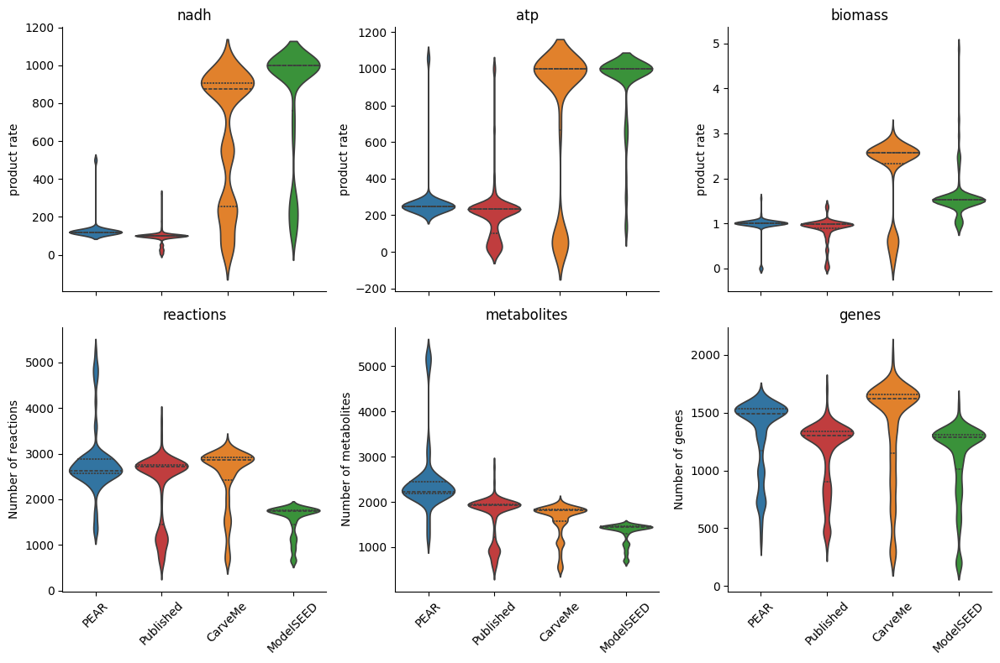

执行出错："Column(s) ['gene', 'reaction'] do not exist"
请检查：
1. Excel文件路径是否正确
2. 工作表名称是否匹配
3. 是否安装所需依赖库（pandas, openpyxl, seaborn）


In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from openpyxl import load_workbook
from openpyxl.drawing.image import Image
import os
import numpy as np

# ======================
# 配置参数
# ======================
INPUT_FILE = '/hpcfs/fhome/wupeng/wp/memote/genome_proteins/batch_analysis.xlsx'
SHEET_NAME = 'BIGG_model'
OUTPUT_FILE = "bigg模型比较_分析结果.xlsx"
CHART_PATH = "model_comparison_0.2.png"
CHART_svg = "model_comparison_0.2.svg"

# ======================
# 数据加载与预处理
# ======================
def load_and_process():
    """加载并处理数据"""
    df = pd.read_excel(INPUT_FILE, sheet_name=SHEET_NAME)
    
    # 清洗数据
    df = df.dropna(how='all').reset_index(drop=True)
    
    # 定义增强型分类逻辑
    def classify_model(name):
        name = str(name)
        if '.faa' in name:
            return 'CarveMe'
        if '.seed' in name:
            return 'ModelSEED'
        if 'GCF' in name and not any(x in name for x in ['.faa', '.seed']):
            return 'PEAR'
        if any(part.startswith('i') and part[1:].isalnum() 
              for part in name.split('_')):
            return 'Published'
        return 'Other'
    
    df['model_type'] = df['fasta_name'].apply(classify_model)
    return df[df['model_type'].isin(['PEAR', 'CarveMe', 'ModelSEED', 'Published'])]

# ======================
# 可视化函数
# ======================
def create_visualization(df):
    """创建增强的可视化图表"""
    plt.figure(figsize=(18, 12))
    metrics = ['nadh', 'atp', 'biomass', 'reactions', 'metabolites', 'genes']
    palette = {'PEAR':'#1f77b4', 'CarveMe':'#ff7f0e', 
              'ModelSEED':'#2ca02c', 'Published':'#d62728'}
    
    # 数据标准化
    df_log = df.copy()
    # for col in metrics:
    #     if col in ['nadh', 'atp', 'biomass']:  # 仅这三列取log
    #         df_log[col] = np.log1p(df[col])
    #     else:  # 其他列保持原值
    #         df_log[col] = df[col]
    
    # 创建分面图
    g = sns.FacetGrid(df_log.melt(id_vars=['model_type'], value_vars=metrics),
                     col='variable', col_wrap=3, sharey=False, height=4)
    g.map_dataframe(sns.violinplot, x='model_type', y='value',  bw=0.2,
                   palette=palette, inner="quartile")
    
    # 设置坐标轴标签
    for ax in g.axes.flat:
        metric = ax.get_title().split('=')[-1].strip()
        ax.set_title(metric, fontsize=12)
        ax.set_xlabel('')

        ax.set_ylabel('product rate')  # 其他仍使用对数刻度
        # 修改 y 轴标签
        if metric == 'reactions':
            ax.set_ylabel('Number of reactions')  # 直接显示数值
        if metric == 'metabolites':
            ax.set_ylabel('Number of metabolites')  # 直接显示数值
        if metric == 'genes':
            ax.set_ylabel('Number of genes')  # 直接显示数值

        ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.savefig(CHART_PATH, dpi=300, bbox_inches='tight')
    plt.savefig(CHART_svg)
    plt.show()
    plt.close()

# ======================
# 保存结果到Excel
# ======================
def save_to_excel(df):
    """保存结果到新Excel文件"""
    # 创建统计摘要
    stats = df.groupby('model_type').agg({
        'nadh': ['mean', 'median'],
        'atp': ['mean', 'median'],
        'biomass': ['mean', 'median'],
        'reaction': ['mean', 'median'],
        'metabolites': ['mean', 'median'],
        'gene': ['mean', 'median']
    })
    
    # 保存到Excel（写入数据和图表）
    with pd.ExcelWriter(OUTPUT_FILE, engine='openpyxl') as writer:
        df.to_excel(writer, sheet_name='原始数据', index=False)
        stats.to_excel(writer, sheet_name='统计摘要')
        
        # 添加图表到一个新工作表
        wb = writer.book
        ws = wb.create_sheet('可视化')
        img = Image(CHART_PATH)
        ws.add_image(img, 'A1')
    
    # 调整列宽
    from openpyxl import load_workbook
    from openpyxl.utils import get_column_letter
    wb = load_workbook(OUTPUT_FILE)
    
    for sheetname in wb.sheetnames:
        ws = wb[sheetname]
        if sheetname == '可视化':
            ws.column_dimensions['A'].width = 50
        else:
            # 遍历所有列（通过列索引方式）
            for col in range(1, ws.max_column + 1):
                max_length = 0
                # 遍历每一列的所有单元格
                for row in range(1, ws.max_row + 1):
                    cell = ws.cell(row=row, column=col)
                    if cell.value:
                        max_length = max(max_length, len(str(cell.value)))
                adjusted_width = max_length + 2
                col_letter = get_column_letter(col)
                ws.column_dimensions[col_letter].width = adjusted_width
    
    wb.save(OUTPUT_FILE)

# ======================
# 主程序
# ======================
if __name__ == "__main__":
    try:
        # 执行分析
        df = load_and_process()
        create_visualization(df)
        save_to_excel(df)
        
        print(f"分析完成！结果已保存至：{OUTPUT_FILE}")
        print("包含以下工作表：")
        print("1. 原始数据 - 清洗后的原始数据")
        print("2. 统计摘要 - 各指标统计值")
        print("3. 可视化 - 模型比较图表")
        
    except Exception as e:
        print(f"执行出错：{str(e)}")
        print("请检查：")
        print("1. Excel文件路径是否正确")
        print("2. 工作表名称是否匹配")
        print("3. 是否安装所需依赖库（pandas, openpyxl, seaborn）")

In [5]:
print(df['reaction'].max())  # 应该输出 13338


13338


In [ ]:
import os
import cobra
import pandas as pd
import time
import openpyxl
from openpyxl import load_workbook

output_file = '/hpcfs/fhome/wupeng/wp/memote/genome_proteins/batch_analysis.xlsx'
sheet_name = 'BIGG_model'

# 目录路径
# folder_path = '/hpcfs/fhome/wupeng/wp/memote/BIGG_carve_model'
# folder_path = '/hpcfs/fhome/wupeng/wp/memote/BIGG_seed_model'
folder_path = '/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model'

# 数据结构
data = {
    "fasta_name": [],
    "fasta_type": [],
    "substrate": [],
    "amino_acids": [],
    "nadh": [],
    "atp": [],
    "biomass": [],
    "reaction": [],
    "metabolites": [],
    "gene": [],
    "size(MB)": [],
    'time(min)':[],
}
zhenhe = [
    "Chlamydomonas reinhardtii",
    "Cricetulus griseus",
    "Mus musculus",
    "Phaeodactylum tricornutum CCAP 1055",
    "Plasmodium berghei",
    "Plasmodium cynomolgi strain B",
    "Plasmodium falciparum 3D7",
    "Plasmodium knowlesi strain H",
    "Plasmodium vivax Sal-1",
    "Saccharomyces cerevisiae S288C",
]

for filename in os.listdir(folder_path):
    start_time = time.time()
    model_path = os.path.join(folder_path, filename)
    model_name = os.path.splitext(filename)[0].replace('_',' ')
    print(model_path)
    for ty in zhenhe:
        if ty in model_name:
            model_type = 'eukaryon'
            break
        else:
            model_type = 'bacteria'
    if 'Methanosarcina barkeri' in model_name:
        model_type = 'archaea'
    file_size = round(os.path.getsize(model_path)/(1024 * 1024),2)
    model = cobra.io.read_sbml_model(model_path)
    try:
        if model_name.endswith("seed") and 'EX_cpd00027_e0' in model.reactions:
            for i in model.exchanges:
                for n in i.metabolites:
                    if 'C' in n.formula:
                        bound = i.bounds
                        i.bounds = (0,1000)
                        sol = model.optimize().objective_value
                        if sol < 0.0000001:
                            i.bounds = (-10,1000)
            model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
            model_substrate = [model.metabolites.cpd00027_e0.name.split(' ')[0].split('-')[1]]
        if not model_name.endswith("seed") and 'EX_glc__D_e' in model.reactions:
            for i in model.exchanges:
                for n in i.metabolites:
                    if 'C' in n.formula:
                        bound = i.bounds
                        i.bounds = (0,1000)
                        sol = model.optimize().objective_value
                        if sol < 0.0000001:
                            i.bounds = (-10,1000)
            model.reactions.EX_glc__D_e.bounds = (-10, 1000)
            model_substrate = [model.metabolites.glc__D_e.name.split(' ')[0].split('-')[1]]
    except KeyError as e:
        print(f"Warning: Unable to set bounds for {model_name}: {e}")
    
    # 提取数据
    genes = len(model.genes)
    reactions = len(model.reactions)
    metabolites = len(model.metabolites)
    try:
        biomass = round(model.optimize().objective_value,2)
        model_amino_acid = ['']
    except Exception:
        biomass = 0  # 如果优化失败，设置为 None
        model_amino_acid = ['']

    try:
        if model_name.endswith("seed"):
            if "rxn00062_c0" not in model.reactions:
                reaction = Reaction('rxn00062_c0')
                model.add_reactions([reaction])
                reaction.name = 'ATP maintenance reaction'
                reaction.build_reaction_from_string('cpd00001_c0 + cpd00002_c0 => cpd00008_c0 + cpd00009_c0 + cpd00067_c0')
            model.objective = model.reactions.rxn00062_c0
            atp = round( model.optimize().objective_value,2)

            model.add_boundary(model.metabolites.get_by_id("cpd00004_c0"), type="demand")
            model.reactions.DM_cpd00004_c0.reaction ='cpd00004_c0 --> cpd00067_c0 + cpd00003_c0'
            model.objective = model.reactions.DM_cpd00004_c0
            NADH = round(model.optimize().objective_value,2)
        if not model_name.endswith("seed") and model_name != 'yeast-GEM':
            if "ATPM" not in model.reactions:
                reaction = Reaction('ATPM')
                model.add_reactions([reaction])
                reaction.name = 'ATP maintenance reaction'
                reaction.build_reaction_from_string('atp_c + h2o_c --> adp_c + h_c + pi_c')
            model.objective = model.reactions.ATPM
            atp = round(model.optimize().objective_value,2)

            model.add_boundary(model.metabolites.get_by_id("nadh_c"), type="demand")
            model.reactions.DM_nadh_c.reaction ='nadh_c --> h_c + nad_c'
            model.objective = model.reactions.DM_nadh_c
            NADH = round(model.optimize().objective_value,2)
    except Exception:
        atp = 0  # 如果优化失败，设置为 None       
        NADH = 0  # 如果优化失败，设置为 None       
    # 填充数据
    full_time = round((time.time() - start_time),2)
    data["fasta_name"].append(model_name)
    data["fasta_type"].append(model_type)
    data["substrate"].append(model_substrate)
    data["amino_acids"].append(model_amino_acid)
    data["nadh"].append(NADH)
    data["atp"].append(atp)
    data["biomass"].append(biomass)
    data["reaction"].append(reactions)
    data["metabolites"].append(metabolites)
    data["gene"].append(genes)
    data["size(MB)"].append(file_size)
    data["time(min)"].append(full_time)

# 创建新的 DataFrame
new_data = pd.DataFrame(data)

existing_data = pd.read_excel(output_file, sheet_name=sheet_name)
merged_data = pd.concat([existing_data, new_data], ignore_index=True)
merged_data['fasta_name'] =  merged_data['fasta_name'].apply(lambda x: x.replace('Archaea_','').replace('Eukaryote_','').
                                          replace('Prokaryote_','').replace('protokaryon_','').replace('eukaryon_',''))
merged_data = merged_data.sort_values(by="fasta_name")


with pd.ExcelWriter(output_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    merged_data.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"Data successfully appended to {sheet_name} in {output_file}.")


/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Escherichia_coli_O157:H7_str._TW14359_GCF_000022225.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Clostridium_ljungdahlii_DSM_13528_GCF_000143685.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Escherichia_coli_LF82_GCF_000284495.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Escherichia_coli_O55:H7_str._CB9615_GCF_000025165.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Escherichia_coli_O127:H6_str._E2348_69_GCF_000026545.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Salmonella_enterica_subsp._enterica_serovar_Typhimurium_str._LT2_GCF_000006945.2.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Acinetobacter_baumannii_AYE_GCF_000069245.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Escherichia_coli_IHE3034_GCF_000025745.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Escherichia_coli_C_GCF_002079225.1.xml
/hpcfs/fhome/wupeng/wp/memote/bigg_pear_model/Escherichia_coli_B_str._REL606_GCF_000017985.1.xml
/hp

In [4]:
excel_file = '/hpcfs/fhome/wupeng/wp/memote/genome_proteins/bigg_model.xlsx'
df = pd.read_excel(excel_file)
df_dict = dict(zip(df['model'],df['organism']))

output_file = '/hpcfs/fhome/wupeng/wp/memote/genome_proteins/batch_analysis.xlsx'
sheet_name = 'BIGG_model'
folder_path = "/hpcfs/fhome/wupeng/wp/database/bigg model/"

# 数据结构
data = {
    "fasta_name": [],
    "fasta_type": [],
    "substrate": [],
    "amino_acids": [],
    "nadh": [],
    "atp": [],
    "biomass": [],
    "reaction": [],
    "metabolites": [],
    "gene": [],
    "size(MB)": [],
    'time(min)':[],
}
zhenhe = [
    "Chlamydomonas reinhardtii",
    "Cricetulus griseus",
    "Mus musculus",
    "Phaeodactylum tricornutum CCAP 1055",
    "Plasmodium berghei",
    "Plasmodium cynomolgi strain B",
    "Plasmodium falciparum 3D7",
    "Plasmodium knowlesi strain H",
    "Plasmodium vivax Sal-1",
    "Saccharomyces cerevisiae S288C",
]

for filename in os.listdir(folder_path):
    start_time = time.time()
    model_path = os.path.join(folder_path, filename)
    model_name = os.path.splitext(filename)[0]
    if model_name in df_dict:
        model_name = f"{df_dict[model_name]}_{model_name}"  # 重写模型名为 "菌株名_模型名"
    else:
        continue
    for ty in zhenhe:
        if ty in model_name:
            model_type = 'eukaryon'
        else:
            model_type = 'bacteria'
    if 'Methanosarcina barkeri' in model_name:
        model_type = 'archaea'
    file_size = round(os.path.getsize(model_path)/(1024 * 1024),2)
    model = cobra.io.read_sbml_model(model_path)
    try:
        if model_name.endswith("seed") and 'EX_cpd00027_e0' in model.reactions:
            for i in model.exchanges:
                for n in i.metabolites:
                    if n.formula != None and 'C' in n.formula:
                        bound = i.bounds
                        i.bounds = (0,1000)
                        sol = model.optimize().objective_value
                        if sol < 0.0000001:
                            i.bounds = (-10,1000)
            model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
            model_substrate = [model.metabolites.cpd00027_e0.name.split(' ')[0].split('-')[1]]
        if not model_name.endswith("seed") and 'EX_glc__D_e' in model.reactions:
            for i in model.exchanges:
                for n in i.metabolites:
                    if n.formula != None and 'C' in n.formula:
                        bound = i.bounds
                        i.bounds = (0,1000)
                        sol = model.optimize().objective_value
                        if sol < 0.0000001:
                            i.bounds = (-10,1000)
            model.reactions.EX_glc__D_e.bounds = (-10, 1000)
            model_substrate = [model.metabolites.glc__D_e.name.split(' ')[0].split('-')[1]]
    except KeyError as e:
        print(f"Warning: Unable to set bounds for {model_name}: {e}")
    
    # 提取数据
    genes = len(model.genes)
    reactions = len(model.reactions)
    metabolites = len(model.metabolites)
    try:
        biomass = round(model.optimize().objective_value,2)
        model_amino_acid = ['']
    except Exception:
        biomass = 0  # 如果优化失败，设置为 None
        model_amino_acid = ['']

    try:
        if model_name.endswith("seed"):
            if "rxn00062_c0" not in model.reactions:
                reaction = Reaction('rxn00062_c0')
                model.add_reactions([reaction])
                reaction.name = 'ATP maintenance reaction'
                reaction.build_reaction_from_string('cpd00001_c0 + cpd00002_c0 => cpd00008_c0 + cpd00009_c0 + cpd00067_c0')
            model.objective = model.reactions.rxn00062_c0
            atp = round( model.optimize().objective_value,2)

            model.add_boundary(model.metabolites.get_by_id("cpd00004_c0"), type="demand")
            model.reactions.DM_cpd00004_c0.reaction ='cpd00004_c0 --> cpd00067_c0 + cpd00003_c0'
            model.objective = model.reactions.DM_cpd00004_c0
            NADH = round(model.optimize().objective_value,2)
        if not model_name.endswith("seed") and model_name != 'yeast-GEM':
            if "ATPM" not in model.reactions:
                reaction = Reaction('ATPM')
                model.add_reactions([reaction])
                reaction.name = 'ATP maintenance reaction'
                reaction.build_reaction_from_string('atp_c + h2o_c --> adp_c + h_c + pi_c')
            model.objective = model.reactions.ATPM
            atp = round(model.optimize().objective_value,2)

            model.add_boundary(model.metabolites.get_by_id("nadh_c"), type="demand")
            model.reactions.DM_nadh_c.reaction ='nadh_c --> h_c + nad_c'
            model.objective = model.reactions.DM_nadh_c
            NADH = round(model.optimize().objective_value,2)
    except Exception:
        atp = 0  # 如果优化失败，设置为 None       
        NADH = 0  # 如果优化失败，设置为 None       
    # 填充数据
    full_time = round((time.time() - start_time),2)
    data["fasta_name"].append(model_name)
    data["fasta_type"].append(model_type)
    data["substrate"].append(model_substrate)
    data["amino_acids"].append(model_amino_acid)
    data["nadh"].append(NADH)
    data["atp"].append(atp)
    data["biomass"].append(biomass)
    data["reaction"].append(reactions)
    data["metabolites"].append(metabolites)
    data["gene"].append(genes)
    data["size(MB)"].append(file_size)
    data["time(min)"].append(full_time)

# 创建新的 DataFrame
new_data = pd.DataFrame(data)

existing_data = pd.read_excel(output_file, sheet_name=sheet_name)
merged_data = pd.concat([existing_data, new_data], ignore_index=True)
merged_data['fasta_name'] =  merged_data['fasta_name'].apply(lambda x: x.replace('Archaea_','').replace('Eukaryote_','').
                                          replace('Prokaryote_','').replace('protokaryon_','').replace('eukaryon_',''))
merged_data = merged_data.sort_values(by="fasta_name")


with pd.ExcelWriter(output_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    merged_data.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"Data successfully appended to {sheet_name} in {output_file}.")
    

/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c258da3400
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c256f1e340
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2a12f6c70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25613ee20
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2581a9a30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c260f9b640
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c267bf4f40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26f213220
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26f1b7310
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c270e34340
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25aab0b50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c264ac9040
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26c82ab20
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25f37bee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26fdcf820
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26bf36130
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26e7b6c70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25ee77940
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26d2807f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c264529b20
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c261956f40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2619a31f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2776eac10
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25ee77940
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:No objective coefficients in model. Unclear what should be optimized


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c267ceeaf0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26ff6e8b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c268b537f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c267ae5640
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c264087460
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26eae97f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c267fa7eb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27af1dbe0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27c494fd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27c8da3a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2734eea30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26c4eb100
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26cdd47c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c266253c70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27f4dc7f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c266260730
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c28511a250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27b156b80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:No objective coefficients in model. Unclear what should be optimized


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2669dfee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c263a0c250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c268eec040
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c28b6cb310
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c28beb7bb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:'' is not a valid SBML 'SId'.


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26f69f070
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2a4833790
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c29353e040
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2a4833df0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26c60e490
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27d9e4460
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26bfc7160
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c264869250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2639c2a00
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27a3f19a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2618c7400
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c260854df0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26e6393d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26a22c7f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2730779d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c273037460
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26ec935e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27630e700
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c29a788fd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25dc9bee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26b0db3d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c266734910
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2607bbb50
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25dc1a8e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27ff20ee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25eeb6220
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c285263f10
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25cd5c520
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c264e9b850
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2636f6070
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25afa5c10
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c263aad640
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c263aad3d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c277b7e0a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c279b8d370
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c262ab23d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27025b5e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c26334a250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c285a0dac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c281d7df70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c264c5b490
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c262446610
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27a411610
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c28a43be80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


ERROR:cobra.io.sbml:No objective coefficients in model. Unclear what should be optimized


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c285271d90
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c28ff597c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2a4efcee0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2727ee8b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27b8b5c70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c284ad5550
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c25d09c6a0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c257136190
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c27b117b80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c289781bb0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c281c57850
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c2a629fd60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c29926b670
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


/hpcfs/fhome/wupeng/anaconda/envs/modelseed/lib/python3.8/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x14c277d8ad90
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Data successfully appended to BIGG_model in /hpcfs/fhome/wupeng/wp/memote/genome_proteins/batch_analysis.xlsx.


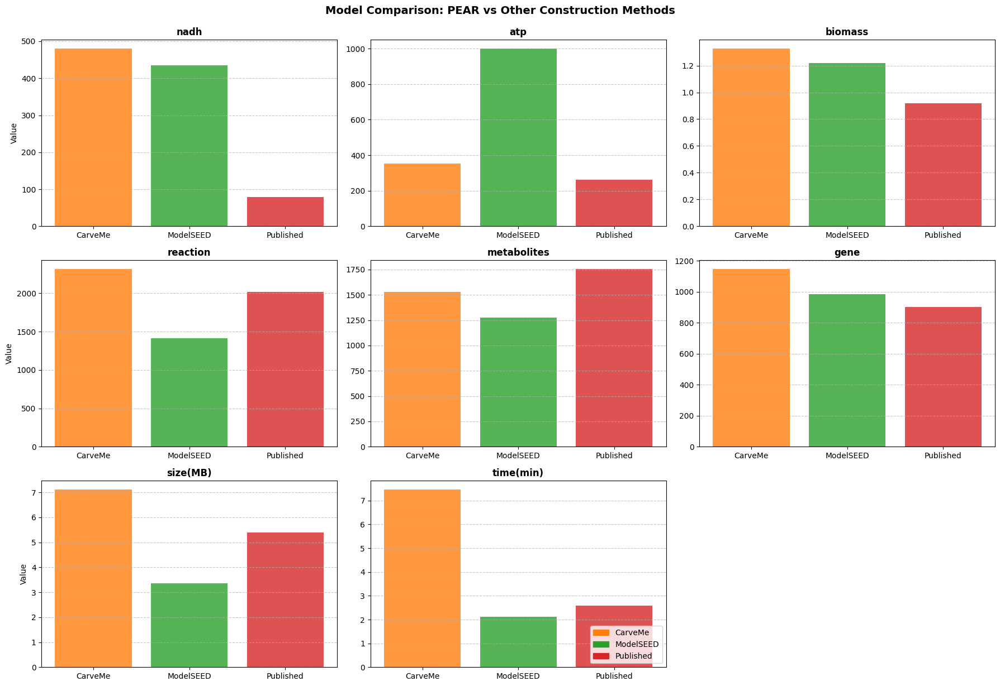

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 创建示例数据（请替换为实际Excel读取）
data = {
    "fasta_name": [
        "Acinetobacter baumannii AYE GCF 000069245.1",
        "Acinetobacter baumannii AYE_GCF_000069245.1.faa",
        "Acinetobacter baumannii AYE_GCF_000069245.1.seed",
        "Acinetobacter baumannii AYE_iCN718",
        "Bacillus subtilis subsp. subtilis str. 168 GCF 000009045.1",
        "Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.faa",
        "Bacillus subtilis subsp. subtilis str. 168_GCF_000009045.1.seed",
        "Bacillus subtilis subsp. subtilis str. 168_iYO844",
        "Bacillus subtilis subsp. subtilis str. 168 GCF 032681245.1",
        "Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.faa",
        "Bacillus subtilis subsp. subtilis str. 168_GCF_032681245.1.seed",
        "Bacillus subtilis subsp. subtilis str. 168_iYO844"
    ],
    "nadh": [120, 1000, 727.12, 96.25, 120, 220, 289.48, 9, 120, 220, 289.48, 9],
    "atp": [240, 930.83, 1000, 665.8, 235, 73.33, 1000, 101.6, 235, 55, 1000, 101.6],
    "biomass": [1.01, 2.58, 1.48, 1.31, 0.98, 0.74, 1.09, 0.62, 0.98, 0.66, 1.09, 0.62],
    "reaction": [2905, 2831, 1339, 1015, 2841, 1738, 1452, 1250, 2840, 2370, 1452, 1250],
    "metabolites": [2609, 1923, 1232, 888, 2524, 1115, 1298, 990, 2520, 1554, 1298, 990],
    "gene": [978, 1133, 937, 709, 1013, 1131, 1011, 844, 1017, 1173, 1006, 844],
    "size(MB)": [5.22, 8.41, 3.22, 4.76, 5.15, 5.73, 3.43, 6.01, 5.16, 7.19, 3.45, 6.01],
    "time(min)": [3.08, 10.76, 2.01, 1.15, 2.42, 4.2, 2.18, 3.21, 2.4, 7.42, 2.18, 3.21]
}

df = pd.DataFrame(data)

# 定义模型类型分类
def classify_model(name):
    if "GCF" in name.split("_") and not any(x in name for x in [".faa", ".seed"]):
        return "PEAR"
    elif ".faa" in name:
        return "CarveMe"
    elif ".seed" in name:
        return "ModelSEED"
    else:
        return "Published"

df["model_type"] = df["fasta_name"].apply(classify_model)

# 计算各指标平均值
metrics = ["nadh", "atp", "biomass", "reaction", "metabolites", "gene", "size(MB)", "time(min)"]
df_mean = df.groupby("model_type")[metrics].mean().T

# 绘制柱状图
plt.figure(figsize=(18, 12))
colors = {"PEAR": "#1f77b4", "CarveMe": "#ff7f0e", "ModelSEED": "#2ca02c", "Published": "#d62728"}

for i, metric in enumerate(metrics, 1):
    plt.subplot(3, 3, i)
    for model in df_mean.columns:
        plt.bar(model, df_mean.loc[metric, model], color=colors[model], alpha=0.8)
    
    plt.title(metric, fontsize=12, fontweight="bold")
    plt.ylabel("Value" if i in [1,4,7] else "")
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    
    if i == len(metrics):
        handles = [plt.Rectangle((0,0),1,1, color=colors[model]) for model in df_mean.columns]
        plt.legend(handles, df_mean.columns, loc="lower right")

plt.tight_layout()
plt.suptitle("Model Comparison: PEAR vs Other Construction Methods", y=1.02, fontsize=14, fontweight="bold")
plt.show()

### 文献

In [73]:
import os
import cobra
import pandas as pd
import time
import openpyxl
from openpyxl import load_workbook

output_file = '/hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis.xlsx'
sheet_name = 'batch_analysis_literiature'

# 目录路径
folder_path = '/hpcfs/fhome/liuysh24/wp/memote/文献序列合_carve_model/'
# folder_path = '/hpcfs/fhome/liuysh24/wp/memote/文献序列合_modelseed_model/'

# 数据结构
data = {
    "fasta_name": [],
    "fasta_type": [],
    "substrate": [],
    "amino_acids": [],
    "nadh": [],
    "atp": [],
    "biomass": [],
    "reaction": [],
    "metabolites": [],
    "gene": [],
    "size(MB)": [],
    'time(min)':[],
}

for filename in os.listdir(folder_path):
    start_time = time.time()
    model_path = os.path.join(folder_path, filename)
    model_name = os.path.splitext(filename)[0]
    model_type = model_name.split('_')[0]
    file_size = round(os.path.getsize(model_path)/(1024 * 1024),2)
    model = cobra.io.read_sbml_model(model_path)
    try:
        if model_name.endswith("seed") and 'EX_cpd00027_e0' in model.reactions:
            for i in model.exchanges:
                for n in i.metabolites:
                    if 'C' in n.formula:
                        bound = i.bounds
                        i.bounds = (0,1000)
                        sol = model.optimize().objective_value
                        if sol < 0.0000001:
                            i.bounds = (-10,1000)
            model.reactions.EX_cpd00027_e0.bounds = (-10, 1000)
            model_substrate = [model.metabolites.cpd00027_e0.name.split(' ')[0].split('-')[1]]
        if not model_name.endswith("seed") and model_name != 'yeast-GEM':
            for i in model.exchanges:
                for n in i.metabolites:
                    if 'C' in n.formula:
                        bound = i.bounds
                        i.bounds = (0,1000)
                        sol = model.optimize().objective_value
                        if sol < 0.0000001:
                            i.bounds = (-10,1000)
            model.reactions.EX_glc__D_e.bounds = (-10, 1000)
            model_substrate = [model.metabolites.glc__D_e.name.split(' ')[0].split('-')[1]]
    except KeyError as e:
        print(f"Warning: Unable to set bounds for {model_name}: {e}")
    
    # 提取数据
    genes = len(model.genes)
    reactions = len(model.reactions)
    metabolites = len(model.metabolites)
    try:
        biomass = round(model.optimize().objective_value,2)
        model_amino_acid = ['']
    except Exception:
        biomass = 0  # 如果优化失败，设置为 None
        model_amino_acid = ['']

    try:
        if model_name.endswith("seed"):
            if "rxn00062_c0" not in model.reactions:
                reaction = Reaction('rxn00062_c0')
                model.add_reactions([reaction])
                reaction.name = 'ATP maintenance reaction'
                reaction.build_reaction_from_string('cpd00001_c0 + cpd00002_c0 => cpd00008_c0 + cpd00009_c0 + cpd00067_c0')
            model.objective = model.reactions.rxn00062_c0
            atp = round( model.optimize().objective_value,2)

            model.add_boundary(model.metabolites.get_by_id("cpd00004_c0"), type="demand")
            model.reactions.DM_cpd00004_c0.reaction ='cpd00004_c0 --> cpd00067_c0 + cpd00003_c0'
            model.objective = model.reactions.DM_cpd00004_c0
            NADH = round(model.optimize().objective_value,2)
        if not model_name.endswith("seed") and model_name != 'yeast-GEM':
            if "ATPM" not in model.reactions:
                reaction = Reaction('ATPM')
                model.add_reactions([reaction])
                reaction.name = 'ATP maintenance reaction'
                reaction.build_reaction_from_string('atp_c + h2o_c --> adp_c + h_c + pi_c')
            model.objective = model.reactions.ATPM
            atp = round(model.optimize().objective_value,2)

            model.add_boundary(model.metabolites.get_by_id("nadh_c"), type="demand")
            model.reactions.DM_nadh_c.reaction ='nadh_c --> h_c + nad_c'
            model.objective = model.reactions.DM_nadh_c
            NADH = round(model.optimize().objective_value,2)
    except Exception:
        atp = 0  # 如果优化失败，设置为 None       
        NADH = 0  # 如果优化失败，设置为 None       
    # 填充数据
    full_time = round((time.time() - start_time),2)
    data["fasta_name"].append(model_name)
    data["fasta_type"].append(model_type)
    data["substrate"].append(model_substrate)
    data["amino_acids"].append(model_amino_acid)
    data["nadh"].append(NADH)
    data["atp"].append(atp)
    data["biomass"].append(biomass)
    data["reaction"].append(reactions)
    data["metabolites"].append(metabolites)
    data["gene"].append(genes)
    data["size(MB)"].append(file_size)
    data["time(min)"].append(full_time)

# 创建新的 DataFrame
new_data = pd.DataFrame(data)

existing_data = pd.read_excel(output_file, sheet_name=sheet_name)
merged_data = pd.concat([existing_data, new_data], ignore_index=True)
merged_data['fasta_name'] =  merged_data['fasta_name'].apply(lambda x: x.replace('Archaea_','').replace('Eukaryote_','').
                                          replace('Prokaryote_','').replace('protokaryon_','').replace('eukaryon_',''))
merged_data = merged_data.sort_values(by="fasta_name")


with pd.ExcelWriter(output_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    merged_data.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"Data successfully appended to {sheet_name} in {output_file}.")


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4c23c520
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d13992af0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3bf79c40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4a4ee700
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d23ed4280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d40bc8d30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3774cdf0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2cee15b0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d39b0baf0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2cd090d0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d30284e80
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1d09f250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d435764c0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d38873b20
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d46bc4280
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2f70bcd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1df22760
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d26868610
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d294e6f40
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d30a93250
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2885bfd0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2727da60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d2d100f70
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d1ab93520
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d21f5dd30
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4a983ca0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d4a240a60
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d3b9e5190
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d44a467f0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d071e9490
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d239c6ac0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d06f1c970
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d06f78700
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Reaction identifier,DM_nadh_c
Name,Nicotinamide adenine dinucleotide - reduced demand
Memory address,0x148d297e92e0
Stoichiometry,nadh_c --> Nicotinamide adenine dinucleotide - reduced -->
GPR,
Lower bound,0
Upper bound,1000.0


Data successfully appended to batch_analysis_literiature in /hpcfs/fhome/liuysh24/wp/memote/genome_proteins/batch_analysis.xlsx.


In [71]:
merged_data

,fasta_name,fasta_type,substrate,amino_acids,nadh,atp,biomass,reaction,metabolites,gene,size(MB),time(min)
0,Archaea_Nitrosopumilus maritimus SCM1_GCF_0000...,archaea,['Glucose'],[''],100.00,185.00,0.88,682,659,294,2.43,15.54
35,Archaea_Nitrosopumilus maritimus SCM1_GCF_0000...,Archaea,[Glucose],[],707.50,100.00,1.60,686,712,362,1.58,0.66
52,Chicken_GCF_016699485.2.seed,Chicken,[Glucose],[],182.07,703.01,4.32,951,911,1966,2.67,1.20
31,Eukaryote_Aspergillus niger_GCF_000002855,eukaryon,['Glucose'],[''],120.00,260.00,1.06,8943,7389,1969,26.60,150.19
47,Eukaryote_Aspergillus niger_GCF_000002855.4.seed,Eukaryote,[Glucose],[],100.00,708.75,1.60,983,960,777,2.38,1.04
...,...,...,...,...,...,...,...,...,...,...,...,...
25,protokaryon_Pseudomonas_putida_KT2440_,protokaryon,['Glucose'],[''],120.00,250.00,1.04,2976,2586,1440,10.30,28.85
60,protokaryon_Stutzerimonas stutzeri A1501.seed,protokaryon,[Glucose],[],815.00,760.62,1.52,1373,1224,1001,3.34,2.06
23,protokaryon_Stutzerimonas_stutzeri_A1501,protokaryon,['Glucose'],[''],120.00,250.00,1.04,2264,1933,1123,7.88,21.37
37,protokaryon_Zymomonas mobilis subsp. mobilis A...,protokaryon,[Glucose],[],700.00,425.00,1.30,911,909,530,2.16,3.58


# dd